In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.optimize import fsolve
import math as math
import pandas as pd
from pylab import cm
from matplotlib import colors as colors

C:\Users\craab\Anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
c = 1.97
def Get_i(arr,val):
    """
    Gives index of array closest to desired value
    
    Input:  arr - numpy array
            val - float
    Output: i   - index of closest value to desired float (int)
    """    
    
    i=np.argmin(np.abs(arr-val))
    return i

def real(array):
    re = []
    for i in array:
        re.append(i.real)
    return re


def imag(array):
    im= []
    for i in array:
        im.append(i.imag)
    return im
        
    
def drude(omega, p, gamma, h):
    """
    Drude dielectric
    Input: 
        omega- frequency (eV)
        p- plasma frequency(eV) 
        gamma- damping constant (eV)
        h- background d|ielectric 
    Output:
    Drude dielectric
    """
    z = h - (p**2 * (1/omega) * 1/(omega + (1j) * gamma))
    return z

def lorentz(omega, f, b, gamma):
    """
    Lorentz dielectric
    Input: 
        omega- frequency (eV)
        b- binding frequency(eV) 
        gamma- damping constant (eV)
        h- background d|ielectric 
    Output:
    Lorentz dielectric
    """
    z = f* b**2 * 1/(b**2 - omega**2 - (1j) * omega*gamma)
    return z

def drude_lorentz(omega, p, gamma1, h, f, b, gamma2):
    """
    Drude Lorentz dielectric 
    Input: 
        omega- frequency (eV)
        b- binding frequency(eV) 
        gamma1- Drude damping constant (eV)
        gamma2- Lorentz damping constant (eV)
        h1- Drude background d|ielectric 
       
    Output:
    Drude-Lorentz dielectric
    """
    z = drude(omega, p, gamma1, h) +lorentz(omega, f, b, gamma2)
    return z


def vacuum(omega):
    vac = np.ones_like(omega)
    return vac

def linear_dielectric(omega, n):
    vac = n*np.ones_like(omega)
    return vac
    

def semi_infinite(omega, dielectric1, dielectric2):
    k = (omega/c)*np.emath.sqrt(dielectric1 * dielectric2/(dielectric1 + dielectric2))
    return k


def anisotropic_semi_infinite(omega, dielectric1, dielectric_xy, dielectric_z):
    c = 1.97
    z = (omega/c) * np.emath.sqrt(dielectric1 * dielectric_z) * np.emath.sqrt((dielectric1-dielectric_xy)/
                                                                              (dielectric1**2-dielectric_xy*dielectric_z))
    return z



def plot_complex_k(omega, k_re, k_im, d, eps1, eps_xy, eps_z, eps3):
    im_rp = np.zeros((len(k_im), len(k_re)))
    for i in k_re:
        for j in k_im:
            ind_i = Get_i(k_re, i)
            ind_j = Get_i(k_im, j)
            k = i + (1j)*j
            k1z = np.emath.sqrt(eps1*(omega/c)**2 - k**2)
            if k1z.imag < 0:
                k1z = -1 *k1z
            if k1z.imag == 0:
                k1z = np.abs(k1z)
            k2z = np.emath.sqrt(eps_xy*(omega/c)**2 - (eps_xy/eps_z)*k**2)
           # if k2z.imag < 0:
               # k2z = -1 * k2z
            #print( "k2z" + str(k2z))
            k3z = np.emath.sqrt(eps3*(omega/c)**2 - k**2)
            if k3z.imag < 0:
                k3z = -1 * k3z
            if k3z.imag == 0:
                k3z = np.abs(k3z)
            r_12 = (eps1*k2z - eps_xy*k1z)/(eps1*k2z + eps_xy*k1z)
            r_23 = (eps_xy*k3z - eps3*k2z)/(eps_xy*k3z + eps3 * k2z)
            rp = (r_12 + r_23*np.exp(2*(1j)*k2z*d))/(1 + r_12*r_23 * np.exp(2*(1j)*k2z*d))
            im_rp[ind_j][ind_i] = np.abs(rp.imag)
    return im_rp




def plot_complex_k4(omega, k_re, k_im, d1, d2, eps1, eps_xy, eps_z, eps3, eps4):
    im_rp = np.zeros((len(k_im), len(k_re)))
    for i in k_re:
        for j in k_im:
            ind_i = Get_i(k_re, i)
            ind_j = Get_i(k_im, j)
            k = i + (1j)*j
            k1z = np.emath.sqrt(eps1*(omega/c)**2 - k**2)
            if k1z.imag < 0:
                k1z = -1 *k1z
            if k1z.imag == 0:
                k1z = np.abs(k1z)
            k2z = np.emath.sqrt(eps_xy*(omega/c)**2 - (eps_xy/eps_z)*k**2)
           # if k2z.imag < 0:
               # k2z = -1 * k2z
            #print( "k2z" + str(k2z))
            k3z = np.emath.sqrt(eps3*(omega/c)**2 - k**2)
            if k3z.imag < 0:
                k3z = -1 * k3z
            if k3z.imag == 0:
                k3z = np.abs(k3z)
            k4z = np.emath.sqrt(eps4*(omega/c)**2 - k**2)
            if k4z.imag < 0:
                k4z = -1 * k4z
            if k4z.imag == 0:
                k4z = np.abs(k4z)
            r_12 = (eps1*k2z - eps_xy*k1z)/(eps1*k2z + eps_xy*k1z)
            r_23 = (eps_xy*k3z - eps3*k2z)/(eps_xy*k3z + eps3 * k2z)
            r_34 = (eps3*k4z - eps4*k3z )/(eps3*k4z + eps4*k3z)
            alpha2 = k2z * d1 * (1j)
            alpha3 = k3z * d2 * (1j)
            rp = (r_12 + r_12*r_23*r_34*np.exp(2*alpha3) + r_23*np.exp(2*alpha2) + r_34 *np.exp(2*alpha2 + 2*alpha3) )/(1 + r_23*r_34 * np.exp(2*alpha3) + r_12*r_23*np.exp(2*alpha2) + r_12*r_34*np.exp(2*alpha2 + 2*alpha3))
            im_rp[ind_j][ind_i] = np.abs(rp.imag)
    return im_rp


# Solving in k-space
def solve_kpoints(omega, d, eps1, eps_xy, eps_z, eps3, eps4, k_min, k_max, k_im_min = 0, 
                  k_im_max = 5, no_solns = 1):
    "Look for solutions in complex space"
    k_points = []
    k_re = np.arange(k_min *(omega/c), k_max, 0.1)
    k_im = np.arange(k_im_min, k_im_max, 0.1)
    kmap = plot_complex_k4(omega, k_re, k_im, d, eps1, eps_xy, eps_z, eps3, eps4)
    k_values1 = np.zeros((len(k_im), len(k_re)))
    k_values2 = np.zeros((len(k_im), len(k_re)))
    for i in range(len(k_re)):
        for j in range(len(k_im)):
            k_values1[j][i] = k_re[i]
            k_values2[j][i] = k_im[j].imag
    k_values = np.ravel(k_values1 + (1j)*k_values2)
    ordered_kmap = np.flip(np.sort(np.ravel(kmap)))
    print(ordered_kmap[0:3])
    indices = np.flip(np.argsort(np.ravel(kmap)))
    print(indices[0:3])
    print(k_values[indices[0]])
    #array with number of solutions to look for
    for i in range(no_solns):
        k_points.append(k_values[indices[i]])
    f, a = plt.subplots(figsize = (10, 6))   
    a.set_title("k-Space Map at " + str(omega) + " eV")
    im = a.imshow(kmap, cmap = cm.plasma, aspect='auto'
           ,extent=[k_re[0],k_re[-1],k_im[0],k_im[-1]],vmin=0,vmax= 0.3 * np.nanmax(kmap), origin = 'lower')
    cbar = plt.colorbar(im)
    cbar.set_label('Im $r_p$')
    a.set_ylim(0, k_im[-1])
    a.set_xlim(0, k_re[-1])
    a.set_ylabel('Im($k_x$) 10$^5$ cm$^{-1}$', fontsize = 15)
    a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$', fontsize = 15)
    plt.axvline(x = omega/c, color = 'white', linestyle = 'dashed', 
                    label = 'light line ($k_x = $' + str(round(omega/c, 2)) + ")" )
    plt.axvline(x = k_min * (omega/c), color = 'lime', linestyle = 'dashed', label = 'k_min')
    plt.axvline(x = k_max * (omega/c), color = 'lime', linestyle = 'dashed', label = 'k_max')
    plt.plot(k_points[0].real, k_points[0].imag, 'x', color = 'lime')
    plt.plot(k_points[1].real, k_points[1].imag, 'x', color = 'lime')
    plt.legend()
    return k_points, kmap


def reflection_coefficient_sf(omega, k, dielectric1, dielectric_xy, dielectric_z):
    "Semi-Infinite Reflection Coefficient"
    im_rp = np.zeros((len(omega), len(k)))
    for i in k:
        for w in omega:
            ind_w = Get_i(omega, w)
            ind_k = Get_i(k, i)
            eps1 = dielectric1[ind_w]
            eps_xy = dielectric_xy[ind_w]
            eps_z = dielectric_z[ind_w]
            k1z = np.emath.sqrt(eps1*(w/c)**2 - i**2)
            if k1z.imag < 0:
                k1z = -1 *k1z
            if k1z.imag == 0:
                k1z = np.abs(k1z)
            k2z = np.emath.sqrt(eps_xy*(w/c)**2 - (eps_xy/eps_z)*i**2)
            if k2z.imag < 0:
                k2z = -1 * k2z
            #print( "k2z" + str(k2z))
            
            r_12 = (eps1*k2z - eps_xy*k1z)/(eps1*k2z + eps_xy*k1z)
            im_rp[ind_w][ind_k] = np.abs(r_12.imag)
    return im_rp

def reflection_coefficient(omega, k, d, dielectric1, dielectric_xy, dielectric_z, dielectric3):
    im_rp = np.zeros((len(omega), len(k)))
    for i in k:
        for w in omega:
            ind_w = Get_i(omega, w)
            ind_k = Get_i(k, i)
            eps1 = dielectric1[ind_w]
            eps_xy = dielectric_xy[ind_w]
            eps_z = dielectric_z[ind_w]
            eps3 = dielectric3[ind_w]
            k1z = np.emath.sqrt(eps1*(w/c)**2 - i**2)
            if k1z.imag < 0:
                k1z = -1 *k1z
            if k1z.imag == 0:
                k1z = np.abs(k1z)
            k2z = np.emath.sqrt(eps_xy*(w/c)**2 - (eps_xy/eps_z)*i**2)
           # if k2z.imag < 0:
               # k2z = -1 * k2z
            #print( "k2z" + str(k2z))
            k3z = np.emath.sqrt(eps3*(w/c)**2 - i**2)
            if k3z.imag < 0:
                k3z = -1 * k3z
            if k3z.imag == 0:
                k3z = np.abs(k3z)
            r_12 = (eps1*k2z - eps_xy*k1z)/(eps1*k2z + eps_xy*k1z)
            r_23 = (eps_xy*k3z - eps3*k2z)/(eps_xy*k3z + eps3 * k2z)
            rp = (r_12 + r_23*np.exp(2*(1j)*k2z*d))/(1 + r_12*r_23 * np.exp(2*(1j)*k2z*d))
            im_rp[ind_w][ind_k] = np.abs(rp.imag)
    return im_rp


def reflection_coefficient_4layer(omega, k, d1, d2, dielectric1, 
                           dielectric_xy, 
                                  dielectric_z, dielectric3, dielectric4):
    """
    Reflection Coefficient for 4-layer model
    """
    c = 1.97
    im_rp = np.zeros((len(omega), len(k)))
    for i in k:
        for w in omega:
            ind_w = Get_i(omega, w)
            ind_k = Get_i(k, i)
            eps1 = dielectric1[ind_w]
            eps_xy = dielectric_xy[ind_w]
            eps_z = dielectric_z[ind_w]
            eps3 = dielectric3[ind_w]
            eps4 = dielectric4[ind_w]
            k1z = np.emath.sqrt(eps1*(w/c)**2 - i**2)
            if k1z.imag < 0:
                k1z = -1 * k1z
            #print(k1z)
            k2z = np.emath.sqrt(eps_xy*(w/c)**2 - (eps_xy/eps_z)*i**2)
            k3z = np.emath.sqrt(eps3*(w/c)**2 - i**2)
            if k3z.imag < 0:
                k3z = -1 * k3z
            k4z = np.emath.sqrt(eps4*(w/c)**2 - i**2)
            if k4z.imag < 0:
                k4z = -1 * k4z
            r_12 = (eps1*k2z -eps_xy*k1z )/(eps_xy*k1z + eps1 * k2z)
            r_23 = (eps_xy*k3z - eps3 * k2z)/(eps_xy*k3z + eps3 * k2z)
            r_34 = (eps3*k4z - eps4*k3z )/(eps3*k4z + eps4*k3z)
            alpha2 = k2z * d1 * (1j)
            alpha3 = k3z * d2 * (1j)
            rp = (r_12 + r_12*r_23*r_34*np.exp(2*alpha3) + r_23*np.exp(2*alpha2) + r_34 *np.exp(2*alpha2 + 2*alpha3) )/(1 + r_23*r_34 * np.exp(2*alpha3) + r_12*r_23*np.exp(2*alpha2) + r_12*r_34*np.exp(2*alpha2 + 2*alpha3))
            ind_w = Get_i(omega, w)
            ind_k = Get_i(k, i)
            im_rp[ind_w][ind_k] = np.abs(rp.imag)
    return im_rp

In [3]:
def solve_point_rp(omega, d, eps1, eps_xy, eps_z, eps3, k_min, k_max, k_im_max = 5):
    k_re = np.linspace(k_min *(omega/1.97), k_max *(omega/1.97), 350)
    k_im = np.linspace(0, k_im_max, 350)
    im_rp = np.zeros((len(k_im), len(k_re)))
    disp1 = np.zeros((len(k_im), len(k_re)))
    disp2 = np.zeros((len(k_im), len(k_re)))
    for i in k_re:
        for j in k_im:
            ind_i = Get_i(k_re, i)
            ind_j = Get_i(k_im, j)
            k = i + (1j)*j
            k1z = np.emath.sqrt(eps1*(omega/c)**2 - k**2)
            if k1z.imag < 0:
                k1z = -1 *k1z
            if k1z.imag == 0:
                k1z = np.abs(k1z)
            k2z = np.emath.sqrt(eps_xy*(omega/c)**2 - (eps_xy/eps_z)*k**2)
           # if k2z.imag < 0:
               # k2z = -1 * k2z
            #print( "k2z" + str(k2z))
            k3z = np.emath.sqrt(eps3*(omega/c)**2 - k**2)
            if k3z.imag < 0:
                k3z = -1 * k3z
            if k3z.imag == 0:
                k3z = np.abs(k3z)
            r_12 = (eps1*k2z - eps_xy*k1z)/(eps1*k2z + eps_xy*k1z)
            r_23 = (eps_xy*k3z - eps3*k2z)/(eps_xy*k3z + eps3 * k2z)
            rp = (r_12 + r_23*np.exp(2*(1j)*k2z*d))/(1 + r_12*r_23 * np.exp(2*(1j)*k2z*d))
            im_rp[ind_j][ind_i] = np.abs(rp.imag)
            disp1[ind_j][ind_i] = 1 + r_12*r_23 * np.exp(2*(1j)*k2z*d)
            disp2[ind_j][ind_i] = (1 + r_12*r_23 * np.exp(2*(1j)*k2z*d)).imag
    
    coord = np.nanargmax(im_rp)
    coord2 = np.unravel_index(coord, (len(k_im), len(k_re)))
    k_out = k_re[coord2[1]] + (1j) * k_im[coord2[0]]
    print(disp1[coord2] + (1j)* disp2[coord2])
    return k_out


def solve_point_disp(omega, d, eps1, eps_xy, eps_z, eps3, k_min, k_max, k_im_min = 0, k_im_max = 5):
    "Solve for a point based on best dispersion point"
    def disp(k, omega):
        k = k[0] + (1j)*k[1]
        k1z = np.emath.sqrt(eps1*(omega/c)**2 - k**2)
        k1z = np.emath.sqrt(eps1*(omega/c)**2 - k**2)
        k2z = np.emath.sqrt(eps_xy*(omega/c)**2 - (eps_xy/eps_z)*k**2)
        k3z = np.emath.sqrt(eps3*(omega/c)**2 - k**2)
        if k1z.imag < 0:   #Imaginary k_1z positive
            k1z = -1 * k1z
        if k1z.imag == 0:
            k1z = np.abs(k1z)
        if k2z.imag < 0:  #imaginary k_2z positive
            k2z = -1 * k2z
        if k2z.imag == 0:
            k2z = np.abs(k2z)
        if k3z.imag < 0: #Imaginary k_3z positive
            k3z = -1 * k3z
                #print("k3z sign flip")
        if k3z.imag == 0:
            k3z = np.abs(k3z)
        r_12 = (eps1*k2z - eps_xy*k1z)/(eps_xy*k1z + eps1 * k2z)
        r_23 = (eps_xy*k3z- eps3*k2z)/(eps_xy*k3z + eps3 * k2z)
        disp = 1 + r_12*r_23 * np.exp(2*(1j)*k2z*d)
        return np.abs(disp.real), np.abs(disp.imag)
    k_vals = []
    disp_vals = []
    
    #Get guess values from r_p starting point
    k_re = np.linspace(k_min*omega/c, k_max*omega/c, 150)
    k_im = np.linspace(k_im_min, k_im_max, 150)  #Iterate through values of real, imag k to find estimate of k
    for i in k_re:
        for j in k_im:
            k_vals.append(i + (1j) * j)
            disp_vals.append(disp([i, j], omega)[0]**2 + disp([i, j], omega)[1]**2)
    best_ind = np.nanargmin(disp_vals)  #append values of k_re, k_im value that maximizes r_p
    best_k = k_vals[best_ind]  #Estimated k value
    
    #Second round of iteration 
    if best_k.real == k_min: range1 = -0.1* best_k.real  #Unique case in which solution is at limits
    if best_k.real == k_max: range2 = -0.1 * best_k.real
    else:    
        range1 = 0.1 * (best_k.real - (k_min*omega/c))
        range2 =  0.1 * ((k_max*omega/c) - best_k.real)
    k_re2 = np.linspace(best_k.real - range1, best_k.real + range2, 200)
    k_im2 = np.linspace(best_k.imag * 0.9,best_k.imag * 1.1, 150)
    k_vals2 = []
    disp_vals2 = []
    for i in k_re2:
        for j in k_im2:
            k_vals2.append(i + (1j) * j)
            disp_vals2.append(disp([i, j], omega)[0]**2 + disp([i, j], omega)[1]**2)
            
    best_ind2 = np.nanargmin(disp_vals2)  #append values of k_re, k_im value that maximizes r_p
    best_k2 = k_vals2[best_ind2]  #Estimated k value
    
    
    test1 = disp([best_k2.real, best_k2.imag], omega)[0]**2 + disp([best_k2.real, best_k2.imag], omega)[1]**2
    root = fsolve(disp, [best_k2.real, best_k2.imag], args = (omega))
    best_k3 = root[0] + 1j * root[1]
    test2 = disp([best_k3.real, best_k3.imag], omega)[0]**2 + disp([best_k3.real, best_k3.imag], omega)[1]**2
    
    if test2 < test1 and best_k3.real >= (k_min * omega/c) and best_k3.real <= (k_max * omega/c) and best_k3.imag >= 0: 
        print("used fsolve")
        return best_k3
    else: 
        print("used manual")
        
        return best_k2
    

In [4]:
def calculate_fields_sf(omega, k_x, eps1, eps_xy, eps_z,x_array, z_array):
    "Calculate Field for a semi-infinite interface"
    x = x_array
    z = z_array
    k_1z = np.emath.sqrt(eps1*(omega/c)**2 - k_x**2)
    k_2z = np.emath.sqrt(eps_xy*(omega/c)**2 - (eps_xy/eps_z)*k_x**2)
    if (k_1z.imag) < 0:
        k_1z = -1 * k_1z
    if (k_2z.imag) < 0:
        k_2z = -1 * k_2z
    print("k_1z " + str(k_1z))
    print("k_2z " + str(k_2z))
    
    E_x_re = np.zeros((len(z), len(x)))
    E_x_im = np.zeros((len(z), len(x)))
    
    E_z_re = np.zeros((len(z), len(x)))
    E_z_im = np.zeros((len(z), len(x)))
    
    Hy_re = np.zeros((len(z), len(x)))
    Hy_im = np.zeros((len(z), len(x)))
    
    S_x = np.zeros((len(z), len(x)))
    S_z = np.zeros((len(z), len(x)))
    
    E0 = 1
    E_1z0 = (k_x/k_1z) *E0
    E_2z0 = -(eps_xy/eps_z)*(k_x/k_2z)*E0
    Hy10 = -(omega*eps1/k_1z)*E0
    Hy20 = (omega*eps_xy/k_2z)*E0
    
    for i in range(len(x)):
        for j in range(len(z)):
            if z[j] < 0: #medium 1
                x_value = E0 * np.exp((-1j)*k_1z*z[j]) * np.exp((1j)*k_x*x[i])
                z_value = -E_1z0 * np.exp((-1j)*k_1z*z[j]) * np.exp((1j)*k_x*x[i])
                h_value = Hy10 * np.exp((-1j)*k_1z*z[j]) * np.exp((1j)*k_x*x[i])
                sx_value = z_value * np.conj(h_value)
                sz_value = x_value * np.conj(h_value)
            elif z[j] > 0: #medium 2
                x_value = E0 * np.exp((1j)*k_2z*z[j]) * np.exp((1j)*k_x*x[i])
                z_value = -E_2z0 * np.exp((1j)*k_2z*z[j]) * np.exp((1j)*k_x*x[i])
                h_value = Hy20 * np.exp((1j)*k_2z*z[j]) * np.exp((1j)*k_x*x[i])
                sx_value = z_value * np.conj(h_value)
                sz_value = x_value * np.conj(h_value)
            E_x_re[j][i] = x_value.real 
            E_x_im[j][i] = x_value.imag
            
            E_z_re[j][i] = z_value.real
            E_z_im[j][i] = z_value.imag
            
            Hy_re[j][i] = h_value.real
            Hy_im[j][i] = h_value.imag
            
            S_x[j][i] = -0.5 * sx_value.real
            S_z[j][i] = 0.5 * sz_value.real
    
    E_x = E_x_re + (1j)*E_x_im
    E_z = E_z_re +(1j)*E_z_im
    Hy = Hy_re + (1j)*Hy_im
    return E_x, E_z, Hy, S_x, S_z


def calculate_fields(omega, k_x, d, eps1, eps_xy, eps_z, eps3, x_array, z_array):
    x = x_array
    z = z_array
    k_1z = np.emath.sqrt(eps1*(omega/c)**2 - k_x**2)
    k_2z = np.emath.sqrt(eps_xy*(omega/c)**2 - (eps_xy/eps_z)*k_x**2)
    if k_1z.imag < 0:   #Imaginary k_1z positive
        k_1z = -1 * k_1z
        print("k1z sign flip")
    if k_1z.imag == 0:
        k_1z = np.abs(k_1z)
    if k_2z.imag < 0:  #imaginary k_2z positive
        k_2z = 1 * k_2z
    if k_2z.imag == 0:
        k_2z = np.abs(k_2z)
    k_3z = np.emath.sqrt(eps3*(omega/c)**2 - k_x**2)
    if k_3z.imag < 0: #Imaginary k_3z positive
        k_3z = -1 * k_3z
        print("k3z sign flip")
    if k_3z.imag == 0:
        k_3z = np.abs(k_3z)
   #Define all positive vectors as decaying downwards
    alpha = (1j) * k_2z * d
    r_12 =  (eps1*k_2z - eps_xy*k_1z)/(eps1*k_2z + eps_xy*k_1z)
    r_23 = (eps_xy*k_3z - eps3*k_2z)/(eps_xy*k_3z + eps3 * k_2z)
    t_23 = 1 + r_23
    t_12 = 1 + r_12
    D3 = 1
    B2 = D3 * (eps3/eps_z)*r_23/(r_23 - 1)
    A2 = D3 * -(eps3/eps_z)*1/(r_23 - 1)
    #D1 = D3 * (eps3/eps1)*r_23 * t_12* (1/(r_23 - 1))* np.exp(alpha) 
    D1 = D3 * -(k_3z/k_1z)*(r_12*np.exp(-alpha) + r_23 * np.exp(alpha))/(t_12*t_23)
    #D1 = -(eps_z/eps_xy)*(k_2z/k_1z) * (r_12*A2*np.exp(-alpha) - B2*np.exp(alpha))/t_12
    
    E_x_re = np.zeros((len(z), len(x)))
    E_x_im = np.zeros((len(z), len(x)))
    
    E_z_re = np.zeros((len(z), len(x)))
    E_z_im = np.zeros((len(z), len(x)))
    
    Hy_re = np.zeros((len(z), len(x)))
    Hy_im = np.zeros((len(z), len(x)))
    
    S_x = np.zeros((len(z), len(x)))
    S_z = np.zeros((len(z), len(x)))
    for i in range(len(x)):
        for j in range(len(z)):
            if z[j] < 0:  #Medium 1
                x_value = (-1/k_x) * -k_1z*D1 * np.exp((-1j)*k_1z*z[j]) * np.exp((1j)*k_x*x[i])
                z_value = D1*np.exp((-1j)*k_1z*z[j]) * np.exp((1j)*k_x*x[i])
                h_value = (-omega/k_x) * eps1 * D1 * np.exp((-1j)*k_1z*z[j]) * np.exp((1j)*k_x*x[i])
                sx_value = z_value * np.conj(h_value)
                sz_value = x_value * np.conj(h_value)
            elif 0 <= z[j] and z[j] <= d: #Medium 2
                x_value = (-1/k_x) *k_2z * (eps_z/eps_xy)* (A2 * np.exp((1j)*k_2z*(z[j]-d)) - B2*np.exp((-1j)*k_2z*(z[j]-d)))* np.exp((1j)*k_x*x[i])
                z_value =  (A2 *np.exp((1j)*k_2z*(z[j]-d)) + B2*np.exp((-1j)*k_2z*(z[j]-d)) )* np.exp((1j)*k_x*x[i])
                h_value = (-omega/k_x) * eps_z * (A2 *np.exp((1j)*k_2z*(z[j]-d)) + B2*np.exp((-1j)*k_2z*(z[j]-d)))* np.exp((1j)*k_x*x[i])
                sx_value = z_value * np.conj(h_value)
                sz_value = x_value * np.conj(h_value)
            elif z[j] > d: #Medium 3
                x_value = (-1/k_x)*k_3z*D3* np.exp((1j)*k_3z*(z[j]-d))* np.exp((1j)*k_x*x[i])
                z_value = D3 * np.exp((1j)*k_3z*(z[j]-d))* np.exp((1j)*k_x*x[i])
                h_value = (-omega/k_x)* eps3 * D3 * np.exp((1j)*k_3z*(z[j]-d))* np.exp((1j)*k_x*x[i])
                sx_value = z_value * np.conj(h_value)
                sz_value = x_value * np.conj(h_value)
            
            E_x_re[j][i] = x_value.real 
            E_x_im[j][i] = x_value.imag
            
            E_z_re[j][i] = z_value.real
            E_z_im[j][i] = z_value.imag
            
            Hy_re[j][i] = h_value.real
            Hy_im[j][i] = h_value.imag
            
            S_x[j][i] = -0.5 * sx_value.real
            S_z[j][i] = 0.5 * sz_value.real
            
    
    E_x = E_x_re + (1j)*E_x_im
    E_z = E_z_re +(1j)*E_z_im
    Hy = Hy_re + (1j)*Hy_im
    return E_x, E_z, Hy, S_x, S_z

In [5]:
def plot_fields_sf(omega, E, dielectric1, dielectric_xy, 
                      dielectric_z, fnameE = None, fnameS = None, spacing = 0.1, 
                   z_lower = 0.5, z_upper = -0.5, x_pixels = 50, z_pixels = 50, 
                   arrow_scaleE = 4, vmin0 = -2, vmax0 = 2, arrow_scaleS = 3, arrow_width = 0.032, equal_mag = False):
    """
    Function for plotting Semi-infinite fields
    omega - energy value to evalulate (float)
    E - energy array
    dielectric 1 -  medium 1 dielectric (array)
    dielectric_xy - medium 2 dielectric xy (array)
    dielectric_z - medium 2 dielectric zz (array)
    fnameE - file name to save electric field image as
    fnameS - file name to save poynting vector image as
    spacing - how much space between zero line, arrows in arrow plot
    z_lower - spatial limit in +z (which is the bottom of the figure!)
    z_upper - spatial limit in -z (which is the top of the figure!)
    x_pixels -  x pixels for field plot
    z_pixels - z pixels for field plot
    arrow_scaleE - scaling for E field arrows
    arrow_scaleS - scaling for S field arrows
    equal_mag - if true makes all arrows the same length
    
    """
    c = 1.97
    ind = Get_i(omega, E)  #Find ind of desired energy
    omega2 = E[ind]  #assign omega2 to value in E array closest to desired value 
    eps1 = dielectric1[ind]
    eps_xy = dielectric_xy[ind]
    eps_z = dielectric_z[ind]
    k_x = (omega2/c) * np.emath.sqrt(eps_z*(eps1**2-eps1*eps_xy)/(eps1**2 -eps_z*eps_xy)) #Calculate k_x
    print( "k_x " + str(k_x))
    print("Propagation Length: " + str(1/k_x.imag) + '10^-5 cm')
    k_1z = np.emath.sqrt(eps1*(omega2/c)**2 - k_x**2)
    k_2z = np.emath.sqrt(eps_xy*(omega2/c)**2 - (eps_xy/eps_z)*k_x**2)
    if (k_1z.imag) < 0:
        k_1z = -1 * k_1z
    if (k_2z.imag) < 0:
        k_2z = -1 * k_2z
    print("k_1z " + str(k_1z))
    print("k_2z " + str(k_2z))
    skin_depth1 = np.abs((1/k_1z.imag))
    print("Skin Depth Dielectric " + str(skin_depth1))
    skin_depth2 = np.abs((1/k_2z.imag))
    print("Skin Depth Metal " + str(skin_depth2))
    
    
    #Check boundary conditions
    E0 = 1
    E_1z = -(k_x/k_1z) 
    E_2z = (eps_xy/eps_z)*(k_x/k_2z)
    Hy10 = -(omega*eps1/k_1z)*E0
    Hy20 = (omega*eps_xy/k_2z)*E0
    print("Check Magnetic Field Boundary Condition")
    print("Hy1 "+ str(Hy10))
    print("Hy2 "+ str(Hy20))
    
    
    print("Check Displacement Field Boundary Condition")
    print("D_1z " + str(-E_1z * eps1))
    print("D_2z " + str(-E_2z * eps_z))
        
    #Define spatial dimensions of plot
    z = np.linspace(z_lower, z_upper, z_pixels)
    x = np.linspace(0, (4*np.pi/k_x.real), x_pixels)
    
    
    E_x, E_z, Hy, S_x, S_z= calculate_fields_sf(omega, k_x, eps1, eps_xy, eps_z, x, z) #calculate fields
    
    #Plot the semi infinite
    f, a = plt.subplots(figsize= (10, 6))        
    plt.plot(E/c, E, color = 'grey', linestyle = 'dashed', label = "Light line")
    plt.plot(E, omega2*np.ones_like(E), color = 'red', linestyle = 'dashed')
    k_val = anisotropic_semi_infinite(E, dielectric1, dielectric_xy, dielectric_z)
    plt.plot(k_val, E, color = 'black', 
            label = 'Re($k_x$)')
    plt.plot(k_val.imag, E, color = 'grey', 
            label = 'Im($k_x$)')
    plt.axvline(x = k_x, color = 'red', linestyle = 'dashed')
    plt.plot(k_x, omega2, 'o', color = 'red', label = 'Point Analyzed')
    plt.xlabel(r'Re($k_x$) 10$^5$ cm$^{-1}$')
    plt.ylabel("Energy(eV)")
    plt.legend()
    plt.show()

    #Make arrays for vector arrow placement
    x2 = np.linspace(x[0],x[-1], 35)
    z_a = np.linspace(z[0], 0 + spacing, 11)
    z_b = np.linspace(0- spacing, z[-1], 11)
    z2 = np.concatenate((z_a, z_b))
    
    #Re-calculate fields with shape of array for vector arrows
    E_x2, E_z2, Hy2, S_x2, S_z2= calculate_fields_sf(omega, k_x, eps1, eps_xy, eps_z, x2, z2) 
    
    #Make all arrows equal length by normalization 
    e_mag = np.zeros_like(E_z2)
    for i in np.arange(len(E_z2)):
        for j in np.arange(len(E_z2[0])):
            e_mag[i][j]= np.abs(np.emath.sqrt(E_z2[i][j].real**2 + E_x2[i][j].real**2))
    
    if equal_mag == True:
        E_z2 = E_z2/e_mag
        E_x2 = E_x2/e_mag
        
        
    f, a = plt.subplots(figsize = (10, 6), dpi = 600)
    X, Z = np.meshgrid(x2, z2)
    a.set_ylabel('Z ($10^{-5}$ cm)', fontsize = 15)
    a.set_xlabel('X ($10^{-5}$ cm)',fontsize = 15)
    plt.plot(x, np.ones_like(x)* 0, linestyle = 'dashed', color = 'black')
    im = plt.imshow(E_z.real, cmap = cm.bwr, aspect='auto'
           ,extent=[x[0],x[-1],z[0],z[-1]],vmin=vmin0, vmax=vmax0, origin = 'lower')
    
    plt.quiver(X, Z, E_x2.real, -1* E_z2.real, units = 'xy', angles = 'uv', 
               pivot = 'mid', width = arrow_width, scale = arrow_scaleE)
    cbar = plt.colorbar(im)
    cbar.set_label('Re $E_z$', rotation = 270)
    if fnameE != None:  #save filename
        plt.savefig(fnameE, bbox_inches = 'tight', dpi = 'figure')
    plt.show()
    
    #Poynting Vector Plot
    f, a = plt.subplots(figsize = (10, 6), dpi = 600)
    X, Z = np.meshgrid(x2, z2)
    a.set_ylabel('Z ($10^{-5}$ cm)', fontsize = 15)
    a.set_xlabel('X ($10^{-5}$ cm)',fontsize = 15)
    plt.plot(x, np.ones_like(x)* 0, linestyle = 'dashed', color = 'black')
    s_mag = np.abs(np.emath.sqrt(S_z.real**2 + S_x.real**2))
    im = plt.imshow(s_mag, cmap = cm.Greens, aspect='auto'
           ,extent=[x[0],x[-1],z[0],z[-1]],vmin=None, vmax=None, origin = 'lower')
    
    plt.quiver(X, Z, S_x2, -1*S_z2, units = 'xy', scale = arrow_scaleS, width = arrow_width)
    cbar = plt.colorbar(im)
    cbar.set_label('Re $|S|$', rotation = 270)
    if fnameS != None: #save filename
        plt.savefig(fnameS, bbox_inches = 'tight', dpi = 'figure')
    plt.show()

    

    

C:\Users\craab\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


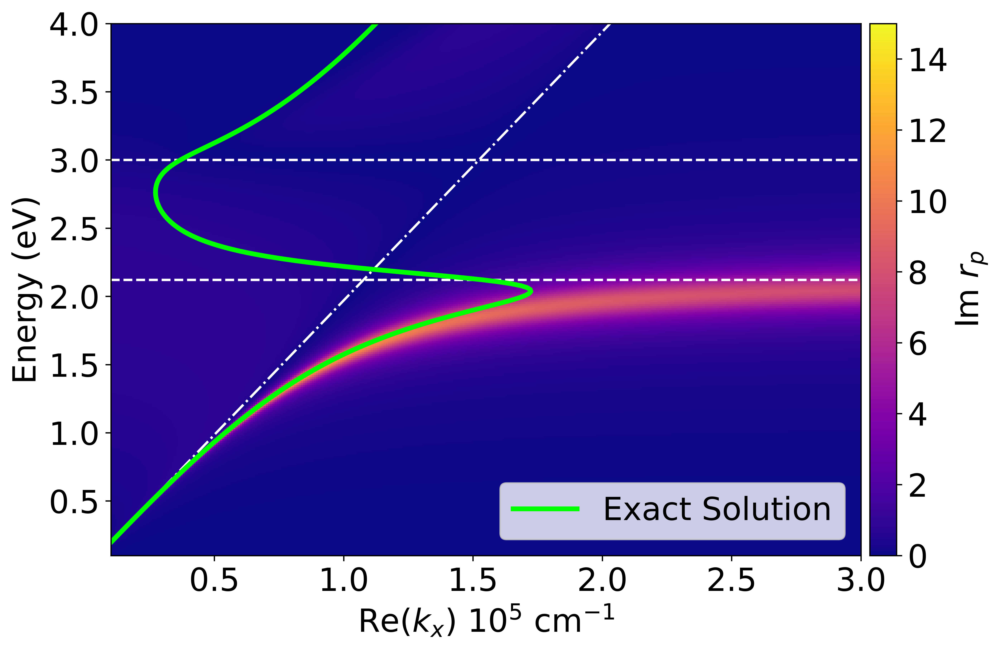

In [6]:
#Semi-Infinite Model for omega_p = 3.5
E = np.linspace(0.05, 5, 350)
k = np.linspace(0.05, 3, 350)

sf_drude = drude(E, 3, 0.3, 1)
d1 = np.ones_like(E)

plt.rcParams.update({'font.size':20})
rp = reflection_coefficient_sf(E, k, d1, sf_drude, sf_drude)
f, a = plt.subplots(figsize = ((10, 6)), dpi = 600)
plt.title("")
im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k[0],k[-1],E[0],E[-1]],vmin=0,vmax= 15, origin = 'lower')
cbar = plt.colorbar(im, pad = 0.01)
cbar.set_label('Im $r_p$' )
a.set_ylim(0.1,4)
a.set_xlim(0.1, k[-1])
a.set_ylabel('Energy (eV)')
a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$')
plt.plot(E/1.97, E, color = 'white', linestyle = 'dashdot')
plt.plot(k, 3* np.ones_like(k), color = 'white', linestyle = 'dashed')
plt.plot(k, 3/np.sqrt(2)* np.ones_like(k), color = 'white', linestyle = 'dashed')
plt.plot(semi_infinite(E, d1, sf_drude), E, color = 'lime', linewidth = 3, label = 'Exact Solution')
plt.legend()
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\semi_infinite_ideal_rp.eps'
plt.savefig(fname1, bbox_inches = 'tight', dpi = 'figure', format = 'eps')

k_x (1.684118579386819+0.6431167657578529j)
Propagation Length: 1.554927585850749210^-5 cm
k_1z (-0.7679978129387848+1.4102708050475803j)
k_2z (-0.4631397867973123+1.970080177819869j)
Skin Depth Dielectric 0.709083671321028
Skin Depth Metal 0.5075935544443781
Check Magnetic Field Boundary Condition
Hy1 (0.5956508812245808+1.093790937473473j)
Hy2 (0.5956508812245805+1.0937909374734731j)
Check Displacement Field Boundary Condition
D_1z (-0.14985571288762903-1.1125733540089846j)
D_2z (-0.1498557128876288-1.1125733540089848j)
k_1z (-0.7690529748810035+1.4083358745157288j)
k_2z (-0.4620872614418628+1.9720145937865918j)


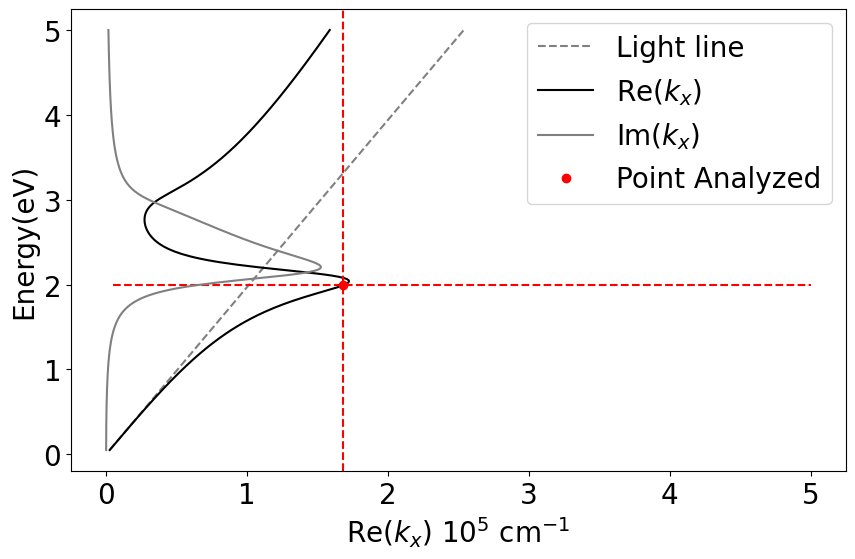

k_1z (-0.7690529748810035+1.4083358745157288j)
k_2z (-0.4620872614418628+1.9720145937865918j)


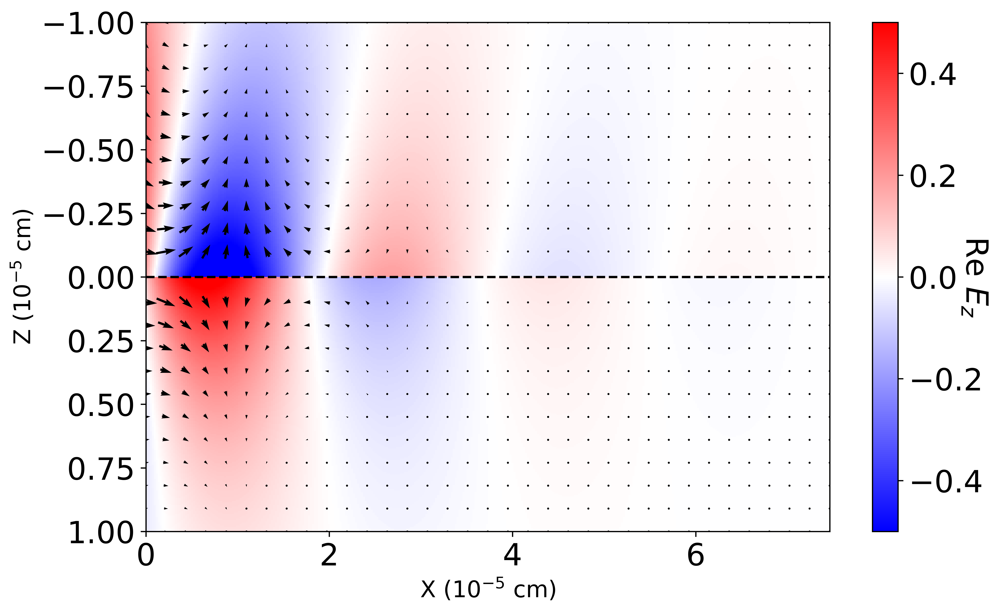

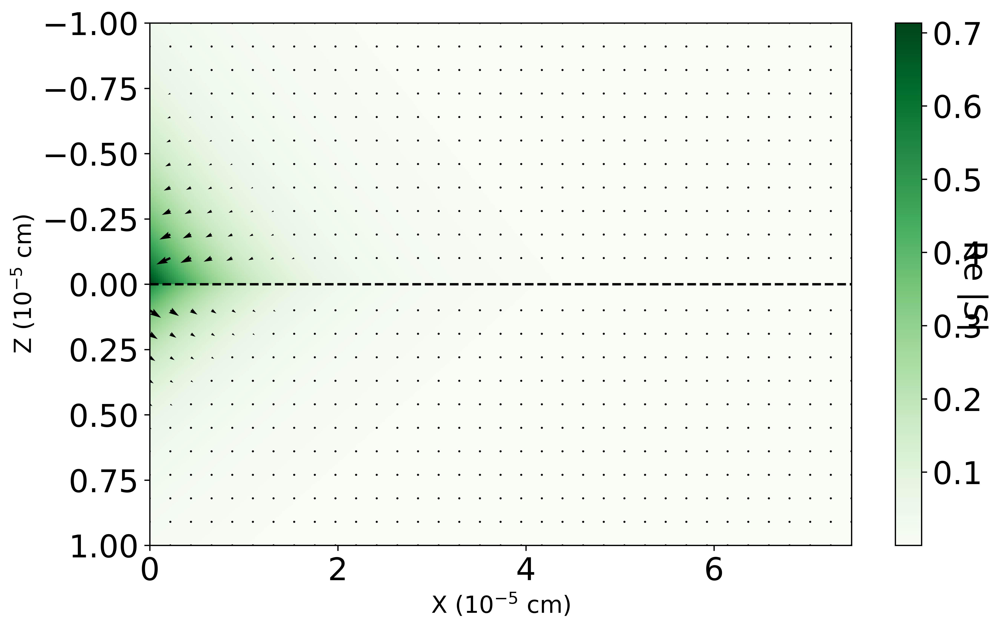

In [7]:
#Ideal Semi-Infinite Model
d1 = np.ones_like(E)
fname = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\sf_ideal.eps'
plot_fields_sf(2, E, d1, sf_drude, 
                      sf_drude, fnameE = fname, spacing = 0.1, z_lower = 1, 
               z_upper = -1, x_pixels = 350, z_pixels = 350, arrow_scaleE = 4, 
                      arrow_scaleS = 3, arrow_width = 0.02, vmin0 = -0.5, vmax0 = 0.5)

C:\Users\craab\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


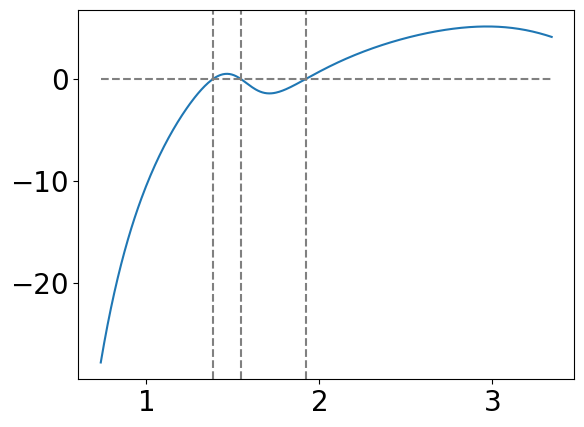

In [8]:
#Import Shamsabadi optimized dielectric function
fname = r'Y:\Collaborations\MXene_EELS_ORNL_UserExpts\Literature Dielectric Functions\Shamsabadi Dielectric\Optimized Ti3C2Tx-Fig 2.xlsx'
df = pd.read_excel(fname)

wav0 = np.asarray(df['nm'].values)
re0 = np.asarray(df['e1 Gen-Osc'].values)
im0 = np.asarray(df['e2 Gen-Osc'].values)
#plt.plot(wav0, re0)
E_opt= np.flip(1239.8/wav0)
plt.show()
sham_s20 = np.flip(re0 + (1j)*im0)
E_sham = np.linspace(E_opt[0], E_opt[-1], 400)
sham_s2 = np.interp(E_sham, E_opt, sham_s20)

zero_1 = E_sham[Get_i(sham_s2, -3.21771170e-02+10.01920281j)]
zero_2 = E_sham[Get_i(sham_s2, -1.17771087e-02+11.66354097j)]
zero_3 = E_sham[Get_i(sham_s2, 2.84511804e-02 +7.31482296j)]

plt.plot(E_sham, sham_s2)
plt.plot(E_sham, 0*E_sham, linestyle = 'dashed', color = 'grey')
plt.axvline(x= zero_1, linestyle = 'dashed', color = 'grey')
plt.axvline(x= zero_2, linestyle = 'dashed', color = 'grey')
plt.axvline(x= zero_3, linestyle = 'dashed', color = 'grey')



Text(0.5, 0, 'Energy(eV)')

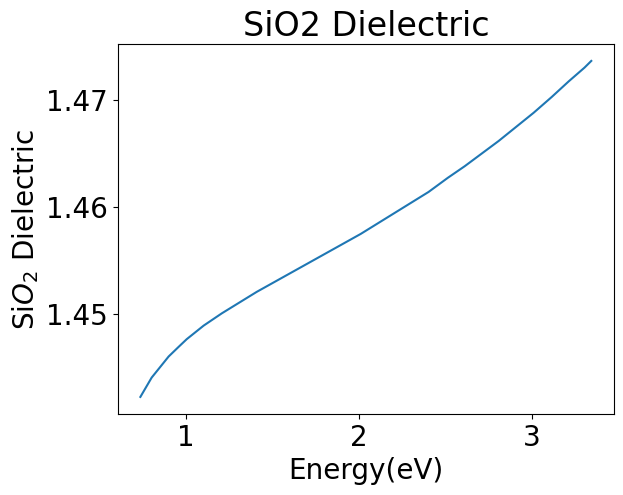

In [9]:
#Import SiO2 dielectric data

fname = r'Y:\Collaborations\MXene_EELS_ORNL_UserExpts\Literature Dielectric Functions\Si_SiO2\SiO2.txt'
sio2_data = open(fname)
#sio2_data = file.read()
#print(data)

wavelength = []
E_sio2 = []
diel0_sio2 = []
for line in sio2_data:
    ast_1 = line.find('*')
    ast_2 = line.find('*', ast_1 + 1)
    ast_3 = line.find('*', ast_2 + 1)
    ast_4 = line.find('*', ast_3 + 1)
    ast_5 = line.find('*' ,ast_4 + 1)
    #print(line)
    wav = float(line[ast_2+1:ast_3])
    #print(wav)
    E_sio2.append(1239.8/wav)
    re = float(line[ast_3+1:ast_4]) 
    im = float(line[ast_4+1:ast_5]) 
    diel0_sio2.append(re + (1j)*im)
#print(E_sio2)
#print(diel0_sio2)

E_sio2 = np.flip(E_sio2)
diel1_sio2 = np.flip( diel0_sio2)


diel_sio2 = np.interp(E_sham, E_sio2, diel1_sio2)


plt.title("SiO2 Dielectric")
plt.plot(E_sham, diel_sio2.real)
plt.ylabel('Si$O_2$ Dielectric')
plt.xlabel('Energy(eV)')

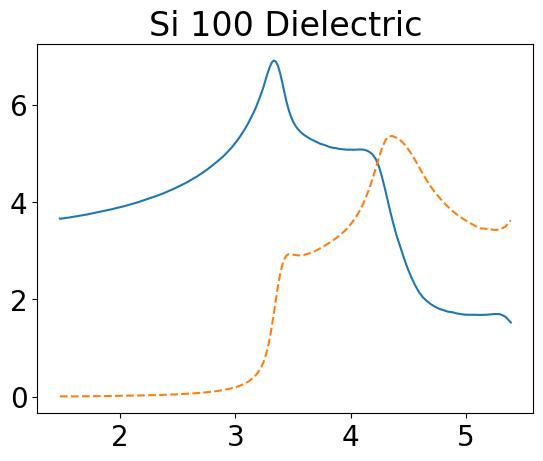

Text(0.5, 0, 'Energy(eV)')

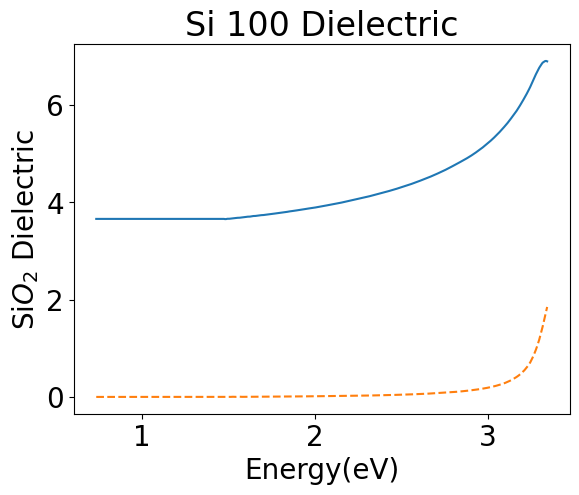

In [10]:
#Import Si100 dielectric data

fname = r'Y:\Collaborations\MXene_EELS_ORNL_UserExpts\Literature Dielectric Functions\Si_SiO2\Si100.txt'
si100_data = open(fname)
#sio2_data = file.read()
#print(data)

wavelength = []
E_si100 = []
diel0_si100 = []
for line in si100_data:
    ast_1 = line.find('*')
    ast_2 = line.find('*', ast_1 + 1)
    ast_3 = line.find('*', ast_2 + 1)
    ast_4 = line.find('*', ast_3 + 1)
    ast_5 = line.find('*' ,ast_4 + 1)
    #print(line)
    wav = float(line[ast_2+1:ast_3])
    #print(wav)
    E_si100.append(1239.8/wav)
    re = float(line[ast_3+1:ast_4]) 
    im = float(line[ast_4+1:ast_5]) 
    diel0_si100.append(re + (1j)*im)
#print(E_si100)
#print(diel0_sio2)

E_si100 = np.flip(E_si100)
diel1_si100 = np.flip( diel0_si100)
plt.title("Si 100 Dielectric")
plt.plot(E_si100, diel1_si100)
plt.plot(E_si100, diel1_si100.imag, linestyle = 'dashed')
plt.show()

re_si = np.interp(E_sham, E_si100, diel1_si100.real)
im_si = np.interp(E_sham, E_si100, diel1_si100.imag)
diel_si = re_si + (1j) * im_si

plt.title("Si 100 Dielectric")
plt.plot(E_sham, diel_si.real)
plt.plot(E_sham, diel_si.imag, linestyle = 'dashed')
plt.ylabel('Si$O_2$ Dielectric')
plt.xlabel('Energy(eV)')

(400,)


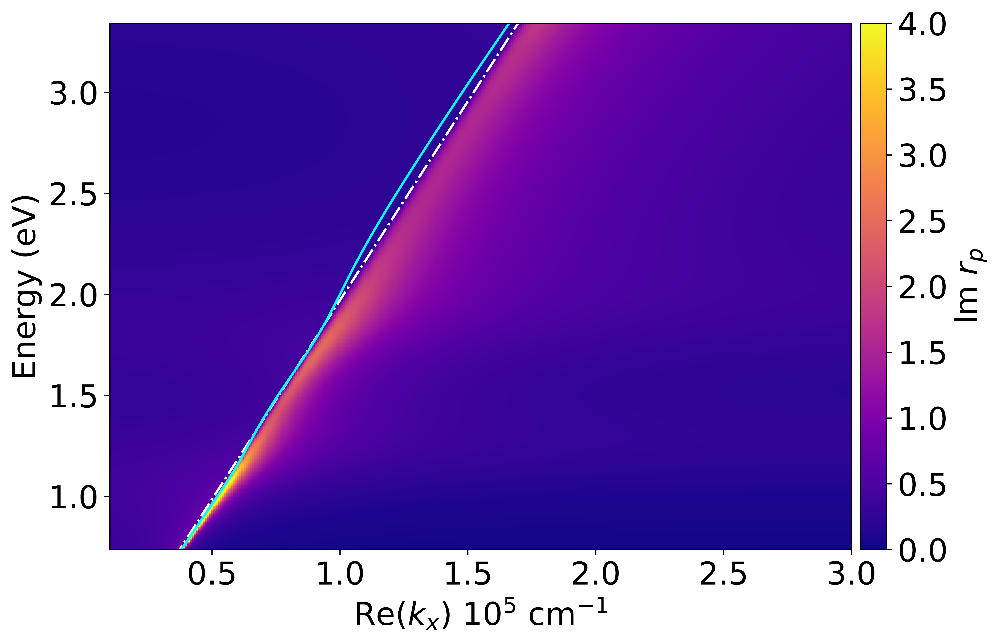

In [11]:
plt.rcParams.update({'font.size':20})
d1 = np.ones_like(E_sham)
rp = reflection_coefficient_sf(E_sham, k, d1, sham_s2, sham_s2)
f, a = plt.subplots(figsize = ((10, 6)), dpi = 600)
im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k[0],k[-1],E_sham[0],E_sham[-1]],vmin=0,vmax= 4, origin = 'lower')
cbar = plt.colorbar(im, pad = 0.01)
cbar.set_label('Im $r_p$' )
a.set_xlim(0.1, k[-1])
a.set_ylim(E_sham[0], E_sham[-1])
a.set_ylabel('Energy (eV)')
a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$')
plt.plot(E/1.97, E, color = 'white', linestyle = 'dashdot')

d1 = np.ones_like(E_sham)
k_x = anisotropic_semi_infinite(E_sham, d1, sham_s2, sham_s2)
print(np.shape(k_x))
plt.plot(k_x, E_sham, color = 'cyan', label = 'Exact Solution')
#plt.legend(loc = 'lower right')
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\semi_infinite_mxene_rp.eps'
plt.savefig(fname1, bbox_inches = 'tight', dpi = 'figure', format = 'eps')

(400,)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


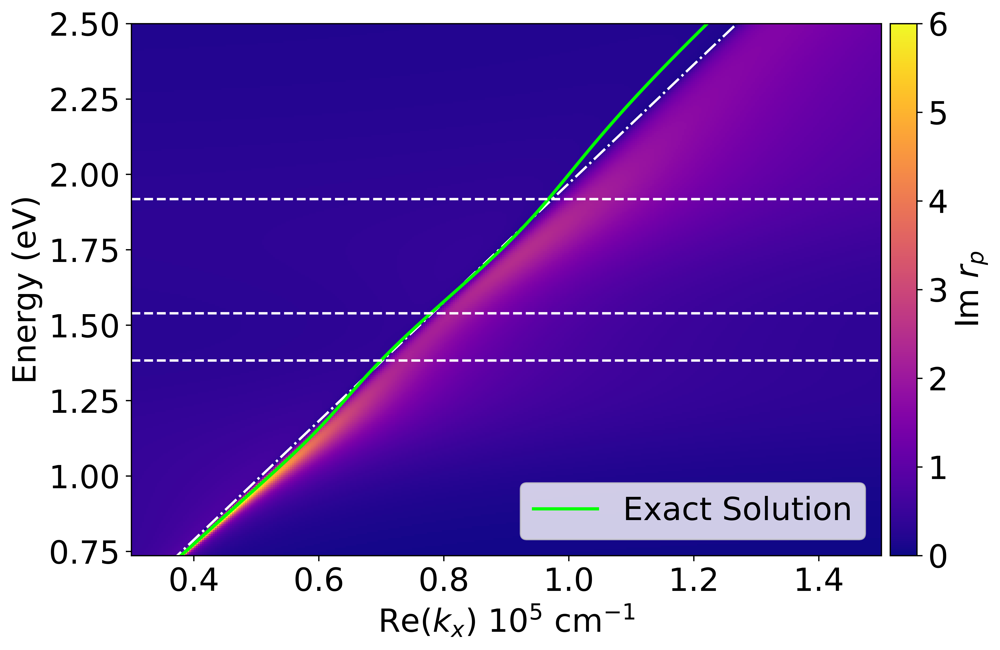

In [12]:
k = np.linspace(0.3, 1.5, 350)
plt.rcParams.update({'font.size':20})
d1 = np.ones_like(E_sham)
rp = reflection_coefficient_sf(E_sham, k, d1, sham_s2, sham_s2)
f, a = plt.subplots(figsize = ((10, 6)), dpi = 600)
im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k[0],k[-1],E_sham[0],E_sham[-1]],vmin=0,vmax= 6, origin = 'lower')
cbar = plt.colorbar(im, pad = 0.01)
cbar.set_label('Im $r_p$' )
a.set_xlim(0.3, 1.5)
a.set_ylim(E_sham[0], 2.5)
a.set_ylabel('Energy (eV)')
a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$')
plt.plot(E/1.97, E, color = 'white', linestyle = 'dashdot')

d1 = np.ones_like(E_sham)
k_x = anisotropic_semi_infinite(E_sham, d1, sham_s2, sham_s2)
print(np.shape(k_x))
plt.plot(k_x, E_sham, color = 'lime', label = 'Exact Solution', linewidth = 2)
#plt.legend(loc = 'lower right')
zero1 = E_sham[Get_i(sham_s2, -3.21771170e-02+10.01920281j)]
zero2 = E_sham[Get_i(sham_s2,  6.09474362e-02+11.64315209j)]
zero3 = E_sham[Get_i(sham_s2,  -3.22984491e-02 +7.36413824j)]
plt.plot(k, zero1 * np.ones_like(k), color = 'white', linestyle = 'dashed')
plt.plot(k, zero2 * np.ones_like(k), color = 'white', linestyle = 'dashed')
plt.plot(k, zero3 * np.ones_like(k), color = 'white', linestyle = 'dashed')
plt.legend(loc = 'lower right')

fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\semi_infinite_mxene_rp2.eps'
plt.savefig(fname1, bbox_inches = 'tight', dpi = 'figure', format = 'eps')

k_x (0.595635294674345+0.02622539824868708j)
Propagation Length: 38.13097480988922410^-5 cm
k_1z (-0.09964920990545814+0.15675761833564897j)
k_2z (0.8807313707094383+1.6989888615689552j)
Skin Depth Dielectric 6.379275282549923
Skin Depth Metal 0.5885853772322768
Check Magnetic Field Boundary Condition
Hy1 (3.321359608767004+5.224812343223814j)
Hy2 (3.321359608767014+5.224812343223812j)
Check Displacement Field Boundary Condition
D_1z (-1.6011271520101753-2.781901407079382j)
D_2z (-1.6011271520101802-2.7819014070793813j)
k_1z (-0.10159050626316757+0.15376213180140644j)
k_2z (0.8826367259560496+1.7019867043944923j)


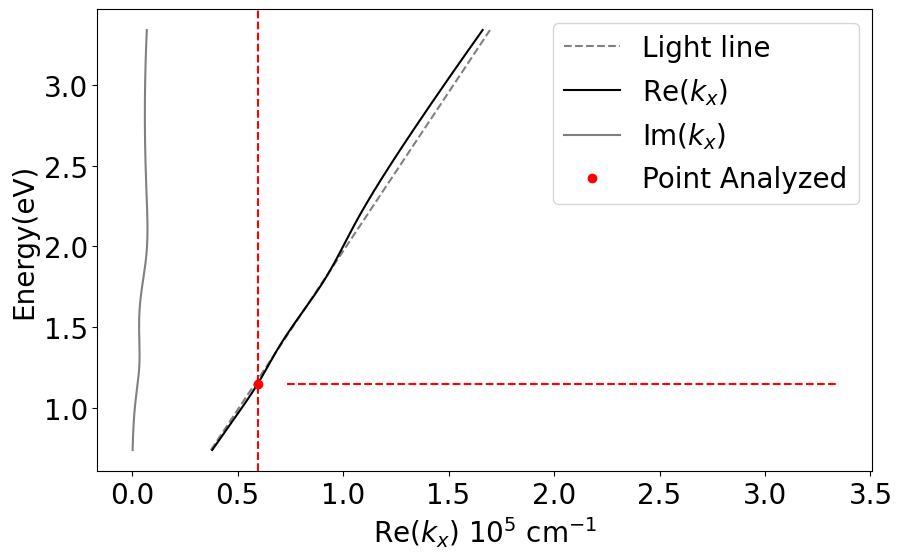

k_1z (-0.10159050626316757+0.15376213180140644j)
k_2z (0.8826367259560496+1.7019867043944923j)


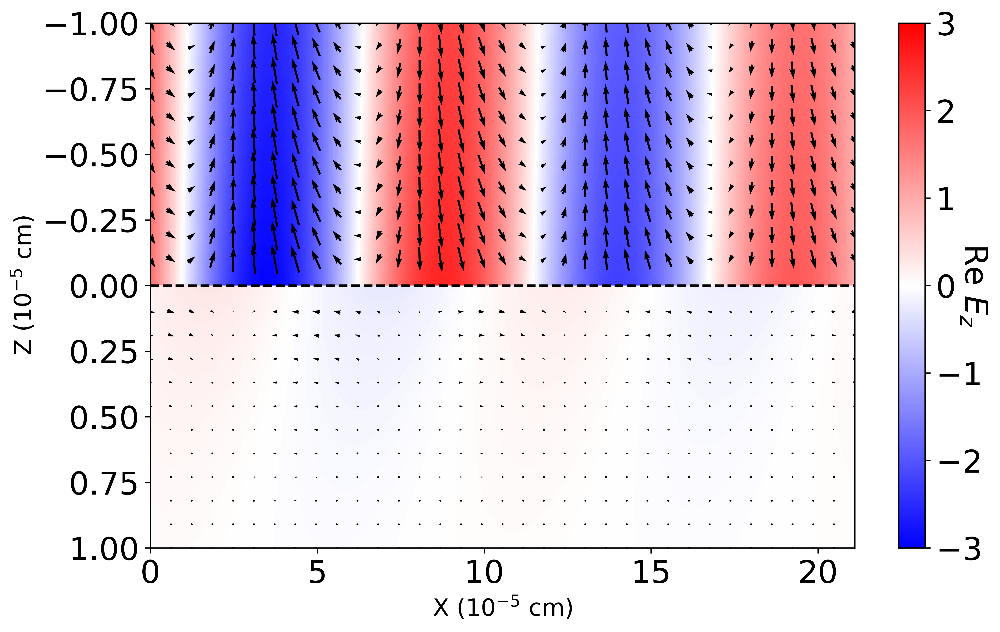

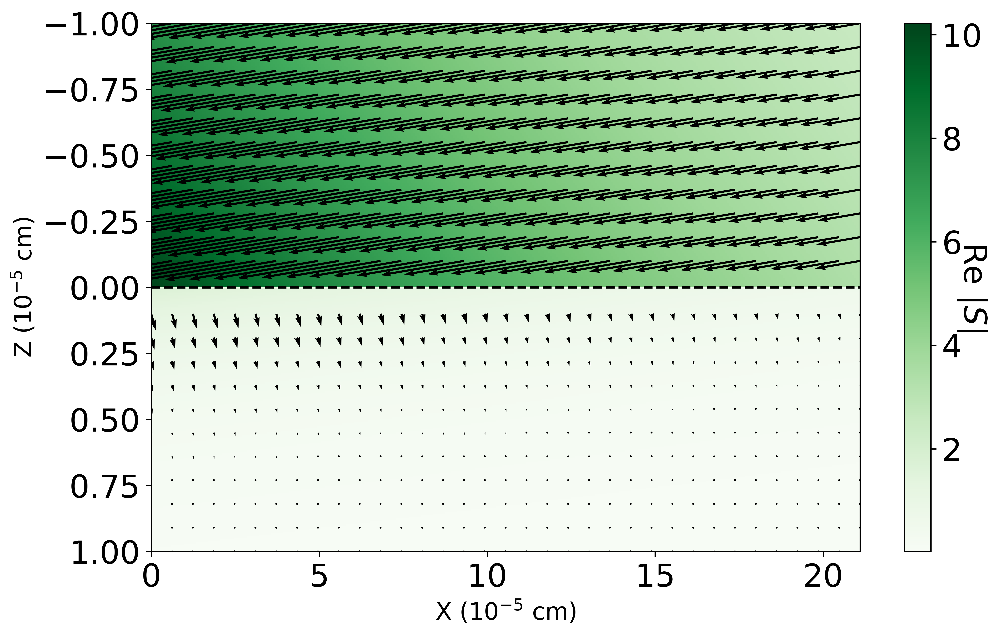

In [13]:
#MXene Semi-Infinite Model
d1 = np.ones_like(E_sham)
fname = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\sf_mxene_field.eps'
plot_fields_sf(1.15, E_sham, d1, sham_s2, 
                      sham_s2, fname, z_lower = 1, z_upper = -1, x_pixels = 350, 
               z_pixels = 350, arrow_scaleE = 4, 
                      arrow_scaleS = 3, arrow_width = 0.05, vmin0 = -3, vmax0 = 3)

In [14]:
def plot_fields(omega, d, E, dielectric1, dielectric_xy, 
                dielectric_z, dielectric3, fnameE = None, fnameS = None, k_min = 1, 
                k_max = 6, k_im_min = 0, k_im_max = 5, vmin0 = 0, vmax0 = 7,
                z_pixels = 150, x_pixels = 150, spacing = 0.05, 
                z_lower = 0.5, z_upper = -0.5, arrow_width = 0.01, arrow_scaleE = 2, arrow_scaleS = 2, complex_k = False, 
                equal_mag = False, E_max = 1):
    "Analytical Thin Film Model Electromagnetic Field Plots"
    '''
    omega - Single Energy point(eV)
    d - thickness ( units: 10^5 cm or 100 nm or 0.1 um)
    params - list of parameters in the order in which they appear on the 
    dielectric1 - dielectric of medium 1
    dielectric_xy - in-plane dielectric of medium 2
    dielectric_z - out-of-plane dielectric of medium 2
    dielectric3 - dielectric of medium 3
    fnameE - filename for electric field plt
    fnameS - filename for Poynting vector plot
    solve_rp - Solve for point using reflection. Otherwise find point with best dispersion method
    k_min - minimum k value (units: omega/c) to look for solutions
    k_max - maximum k value (units: omega/c) to look for solutions
    k_im_max - maximum imaginary k value (absolute) to look for solutions
    auto_scale - Boolean. If true autoscales the Im(rp) colormap
    vmin0/vmax0 - manual data range of Im(rp) colormap if auto_scale = False
    z_pixels - number of z points to evaluate field at
    x_pixels - number of x points to evaluate field at
    auto_z - Boolean. Automatic assignment of upper/lower vertical coordinates on graph
    z_lower - lower limit of z (positive is down!)
    z_upper - upper limit of z (positive is down!)
    arrow_scaleE/S - inverse scaling for arrows in vector plots electric field/poynting vector
    complex_k - plot heat map of Im(r_p) over the complex plane in k-space 
    E_max - max value to show for heatmap of Re E_z in electric field plot
    
    
    '''
    c= 1.97
    # Need to assign each parameter to correct dielectric function
    
    ind_w = Get_i(E, omega)
    omega2 = E[ind_w]  #assign omega2 to value in E array closest to desired value 
    eps1 = dielectric1[ind_w]
    eps_xy = dielectric_xy[ind_w]
    eps_z = dielectric_z[ind_w]
    eps3 = dielectric3[ind_w]
        
    
    k_x = solve_point_disp(omega2, d, eps1, eps_xy, eps_z, eps3, k_min, k_max, k_im_min = k_im_min, k_im_max = k_im_max)
    
    if k_x.real < 0 or k_x.imag < 0:
        k_x = -1 * k_x   #imaginary k_x must be positive for decay to be handled correctly
    print("k_x "+ str(k_x))
    
    k_1z = np.emath.sqrt(eps1*(omega2/c)**2 - k_x**2)
    k_2z = np.emath.sqrt(eps_xy*(omega2/c)**2 - (eps_xy/eps_z)*k_x**2)
    k_3z = np.emath.sqrt(eps3*(omega2/c)**2 - k_x**2)
    if k_1z.imag < 0:   #Imaginary k_1z positive
        k_1z = -1 * k_1z
    if k_1z.imag == 0:
        k_1z = np.abs(k_1z)
    if k_2z.imag < 0:  #imaginary k_2z positive
        k_2z = 1 * k_2z
    if k_2z.imag == 0:
        k_2z = np.abs(k_2z)
    k_3z = np.emath.sqrt(eps3*(omega2/c)**2 - k_x**2)
    if k_3z.imag < 0: #Imaginary k_3z positive
        k_3z = -1 * k_3z
    if k_3z.imag == 0:
        k_3z = np.abs(k_3z)
    
    skin_depth1 = np.abs((1/k_1z.imag))   #Calculate skin depth (z value where fields drops off to 1/e)
    skin_depth3 = np.abs((1/k_3z.imag))
    print("k_1z " + str(k_1z))
    print("k_2z " + str(k_2z))
    print("k_3z " + str(k_3z))
    
    print("Skin Depth Medium 1: " + str(skin_depth1))
    print("Skin Depth Medium 3: " + str(skin_depth3))
    
    prop_len = np.abs((1/k_x.imag))  #In-plane propagation length
    print("Propagation Length " + str(prop_len))
    
    z = np.linspace(z_lower, z_upper, z_pixels)
    
             
    #Coefficients for fields that solve Maxwell equations, fit dispersion  
    alpha = (1j) *k_2z * d
    r_12 = (eps1*k_2z - eps_xy*k_1z)/(eps1*k_2z + eps_xy*k_1z)
    r_23 = (eps_xy*k_3z - eps3*k_2z)/(eps_xy*k_3z + eps3 * k_2z)
    t_23 = 1 + r_23
    t_12 = 1 + r_12
    
    print("Dispersion quality " + str(1 + r_12*r_23 * np.exp(2*alpha))) #Check quality of solution (should be 0)
    x = np.linspace(0, (np.pi*2/k_x.real), x_pixels)  #x values out to two wavelengths of plasmon
    
    
    
    E_3x = 1
    E_2x_plus0 = E_3x/t_23
    E_2x_minus0 = E_3x*r_23/t_23
    
    
    E_2x_plus = E_2x_plus0 * np.exp(-alpha)
    E_2x_minus = E_2x_minus0 * np.exp(alpha)
    E_1x = (1/t_12)*(r_12*E_2x_plus + E_2x_minus)
    
    
    
    
    # Check Boundary Conditions
    H_y10 = -(omega2/k_1z) * eps1*E_1x
    H_y20 = (omega2/k_2z) * eps_xy * (E_2x_plus - E_2x_minus)
    if H_y10 != H_y20:
        print("Check magnetic boundary condition at z = 0")
        print(H_y10)
        print(H_y20)
        
    H_y2d = (omega2/k_2z) * eps_xy * (E_2x_plus0 - E_2x_minus0)
    H_y3d = (omega2/k_3z)* eps3 * E_3x
    if H_y2d != H_y3d:
        print("Check magnetic boundary condition at z = d")
        print(H_y2d)
        print(H_y3d)
  

    E_x, E_z, Hy, S_x, S_z = calculate_fields(omega2, k_x, d, eps1, eps_xy, eps_z, eps3, x, z)
    
    #Plot reflection coefficient to get the dispersion  
    k1 = np.linspace(0, k_x.real + 1, 200)
    f,a=plt.subplots(1,1,dpi=200,figsize=(10,6))
    a.set_title('Plasmonic Dispersion', fontsize = 20)
    rp = reflection_coefficient(E, k1, d, dielectric1, 
                               dielectric_xy, dielectric_z,
                               dielectric3)
    im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k1[0],k1[-1],E[0],E[-1]],vmin=vmin0,vmax=vmax0, origin = 'lower')
    cbar = plt.colorbar(im)
    cbar.set_label('Im $r_p$')
    if k_max*omega >= E[-1]: a.set_ylim(0, E[-1])
    else:  a.set_ylim(0, k_max*omega)
    a.set_xlim(0, k_x.real + 1)
    a.set_ylabel('Energy (eV)', fontsize = 15)
    a.set_xlabel('Re($k_x$)  $\mu$m$^{-1}$', fontsize = 15)
    
    # Plot point being analyzed
    plt.plot(E/1.97, E, color = 'white', linestyle = 'dashed')
   
    plt.plot(k1, omega2*np.ones_like(k1), color = 'red', linestyle = 'dashed')
    plt.axvline(x = k_x, color = 'red', linestyle = 'dashed')
    plt.plot(k_x, omega2, 'o', color = 'red', label = 'Point Analyzed')

    plt.xlabel(r'Re($k_x$)  $\mu$m$^{-1}$')
    plt.ylabel("Energy(eV)")
    plt.legend()
    plt.show()
    
    
    #Plot Complex k-space
    if complex_k:
        k_im = np.linspace(0, k_im_max, 300)
        k_re = np.linspace(0, k_max * (omega/c) + 1, 250)
        kmap = plot_complex_k(omega, k_re, k_im, d, eps1, eps_xy, eps_z, eps3)
        f, a = plt.subplots(figsize = (10, 6))
        a.set_title("k-Space Map at " + str(omega) + " eV")
        im = a.imshow(kmap, cmap = cm.plasma, aspect='auto'
           ,extent=[k_re[0],k_re[-1],k_im[0],k_im[-1]],vmin=vmin0,vmax= 0.3 * np.nanmax(kmap), origin = 'lower')
        cbar = plt.colorbar(im)
        cbar.set_label('Im $r_p$')
        a.set_ylim(0, k_im[-1])
        a.set_xlim(0, k_re[-1])
        a.set_ylabel('Im($k_x$)  $\mu$m$^{-1}$', fontsize = 15)
        a.set_xlabel('Re($k_x$)  $\mu$m$^{-1}$', fontsize = 15)
        plt.axvline(x = omega2/c, color = 'white', linestyle = 'dashed', 
                    label = 'light line ($k_0 = $' + str(round(omega/c, 2)) + ")" )
        plt.axvline(x = k_min * (omega2/c), color = 'lime', linestyle = 'dashed', label = 'k_min')
        plt.axvline(x = k_max * (omega2/c), color = 'lime', linestyle = 'dashed', label = 'k_max')
        plt.plot(k_x.real, k_x.imag, 'x', color = 'lime')
        plt.legend()
        plt.show()
    
    
    #Construct arrays for vector arrays coordinates
    x2 = np.linspace(x[0],x[-1], 20)
    z_a = np.linspace(z[0], d + spacing, 6)
    z_b = np.linspace(d - spacing , 0 + spacing, int(d/0.1))
    z_c = np.linspace(0 - spacing, z[-1], 6)
    z2 = np.concatenate((z_a, z_b, z_c))
    
    
    E_x2, E_z2, Hy2, S_x2, S_z2 = calculate_fields(omega, k_x, d, eps1, eps_xy, eps_z, eps3, x2, z2)
    
    e_mag = np.zeros_like(E_z2)
    for i in np.arange(len(E_z2)):
        for j in np.arange(len(E_z2[0])):
            e_mag[i][j]= np.abs(np.emath.sqrt(E_z2[i][j].real**2 + E_x2[i][j].real**2))
    
    if equal_mag == True:
        E_z2 = E_z2/e_mag
        E_x2 = E_x2/e_mag
    
    #Plot Electric Field Vector Plot
    f, a = plt.subplots(figsize = (6, 8), dpi = 600)
    X, Z = np.meshgrid(x2, z2)
    a.set_ylabel('Z ($10^5$ cm$^{-1}$)', fontsize = 15)
    a.set_xlabel('X ($10^5$ cm$^{-1}$',fontsize = 15)
    plt.plot(x, np.ones_like(x)* 0, linestyle = 'dashed', color = 'black')
    plt.plot(x, np.ones_like(x)* d, linestyle = 'dashed', color = 'black')
    im = plt.imshow(E_z.real, cmap = cm.bwr, aspect='auto'
           ,extent=[x[0],x[-1],z[0],z[-1]],vmin=-E_max, vmax=E_max, origin = 'lower')
    plt.quiver(X, Z,  E_x2.real, -1*E_z2.real, units = 'xy', pivot = 'mid', width = arrow_width, scale = arrow_scaleE)
    cbar = plt.colorbar(im, pad = 0.01)
    cbar.set_label('Re $E_z$')
    
    if fnameE != None:  #save filename
        plt.savefig(fnameE, bbox_inches = 'tight', dpi = 'figure')
    plt.show()
    plt.show()
    
    
    #Plot Poynting Vector
    f, a = plt.subplots(figsize = (10, 6), dpi = 600)
    X, Z = np.meshgrid(x2, z2)
    a.set_ylabel('Z ($10^5$ cm$^{-1}$)', fontsize = 15)
    a.set_xlabel('X ($10^5$ cm$^{-1}$)',fontsize = 15)
    plt.plot(x, np.ones_like(x)* d, linestyle = 'dashed', color = 'black')
    plt.plot(x, np.ones_like(x)* 0, linestyle = 'dashed', color = 'black')
    s_mag = np.abs(np.emath.sqrt(S_z.real**2 + S_x.real**2))
    im = plt.imshow(s_mag, cmap = cm.Greens, aspect='auto'
           ,extent=[x[0], x[-1], z[0],z[-1]],vmin=0, vmax= 0.8 * np.nanmax(s_mag), origin = 'lower')
    plt.quiver(X, Z, S_x2.real, -1*S_z2.real, units = 'xy', pivot = 'mid', scale = arrow_scaleS)
    cbar = plt.colorbar(im, pad = 0.01)
    cbar.set_label('$|S|$')
    if fnameS != None:  #save filename
        plt.savefig(fnameS, bbox_inches = 'tight', dpi = 'figure')
    plt.show()
    

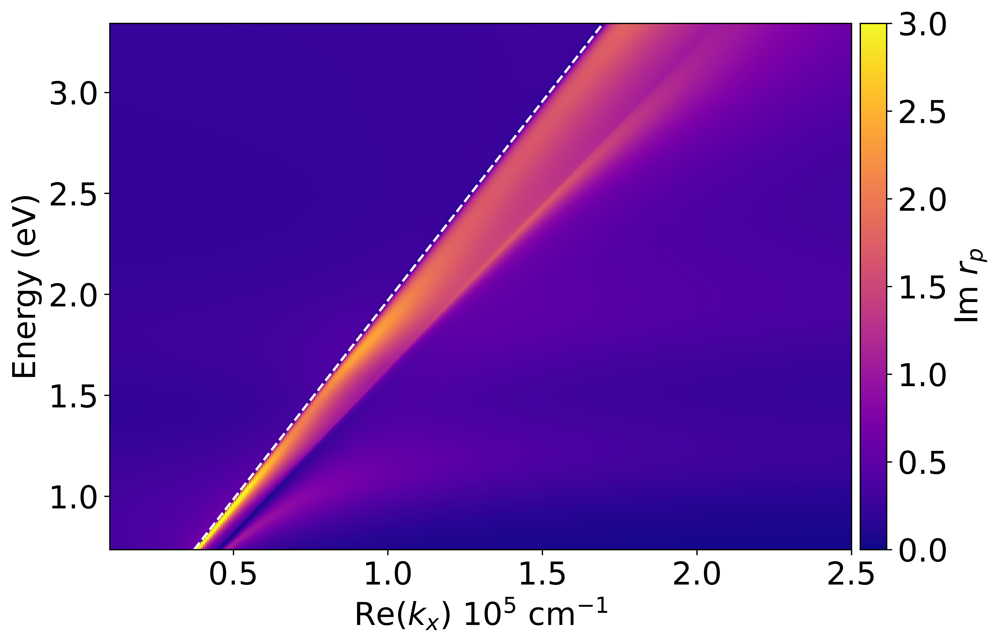

In [15]:
#MXene on Si/SiO2
ones = np.ones_like(E_sham)
k = np.linspace(0.01, 2.5, 350)
rp = reflection_coefficient(E_sham, k, 0.5, ones, sham_s2, sham_s2, diel_sio2)

f, a = plt.subplots(figsize = ((10, 6)), dpi = 600)
#plt.title("Reflection Coefficient for MXene on Si/SiO2")
im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k[0],k[-1],E_sham[0],E_sham[-1]],vmin=0,vmax= 3, origin = 'lower')
cbar = plt.colorbar(im, pad = 0.01)
cbar.set_label('Im $r_p$' )
a.set_ylim(E_sham[0],E_sham[-1])
a.set_xlim(0.1, k[-1])
a.set_ylabel('Energy (eV)')
a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$')
plt.plot(E_sham/1.97, E_sham, color = 'white', linestyle = 'dashed')
#plt.plot(k, zero_1 * np.ones_like(k), color = 'white', linestyle = 'dashed')
#plt.plot(k, zero_2 * np.ones_like(k), color = 'white', linestyle = 'dashed')
#plt.plot(k, zero_3 * np.ones_like(k), color = 'white', linestyle = 'dashed')
fname = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\rp_mxene_3layer.eps'
plt.savefig(fname, bbox_inches = 'tight', format = 'eps')

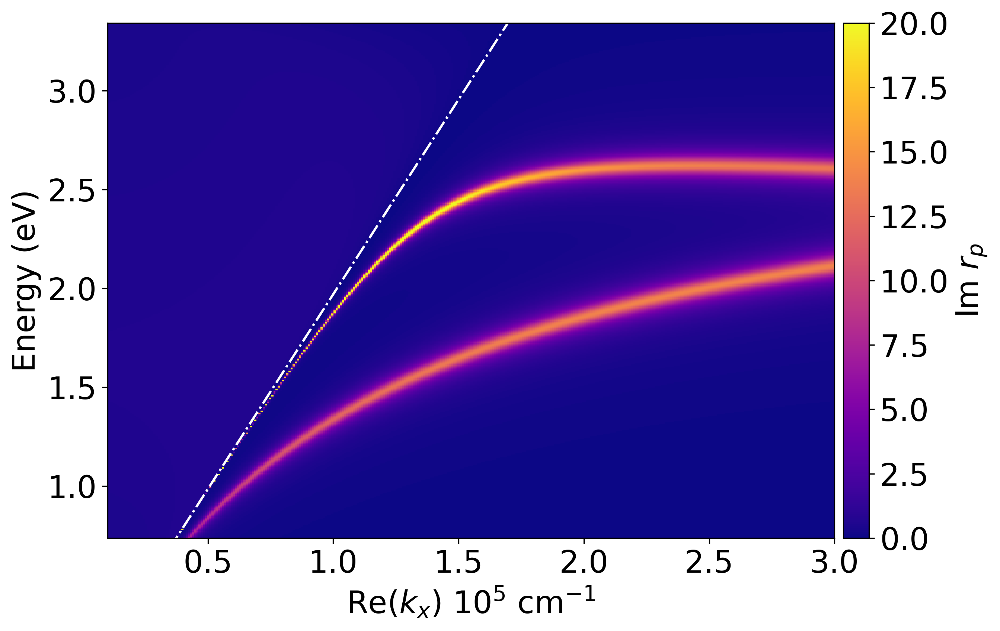

In [16]:
#Ideal Metal vaccuum
plt.rcParams.update({'font.size':20})
ideal = drude(E_sham, 3.5, 0.1, 1)
k1 = np.linspace(0.01, 3, 350)
d1 = np.ones_like(E_sham)
rp = reflection_coefficient(E_sham, k1, 0.5, d1, ideal, ideal, d1)
f, a = plt.subplots(figsize = ((10, 6)), dpi = 300)
plt.title("")
im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k1[0],k1[-1],E_sham[0],E_sham[-1]],vmin=0,vmax= 20, origin = 'lower')
cbar = plt.colorbar(im, pad = 0.01)
cbar.set_label('Im $r_p$' )
a.set_ylim(E_sham[0],E_sham[-1])
a.set_xlim(0.1, k1[-1])
a.set_ylabel('Energy (eV)')
a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$')
plt.plot(k1, k1*1.97, color = 'white', linestyle = 'dashdot')



fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\vac_metal_vac.eps'
plt.savefig(fname1, bbox_inches = 'tight', dpi = 'figure', format = 'eps')

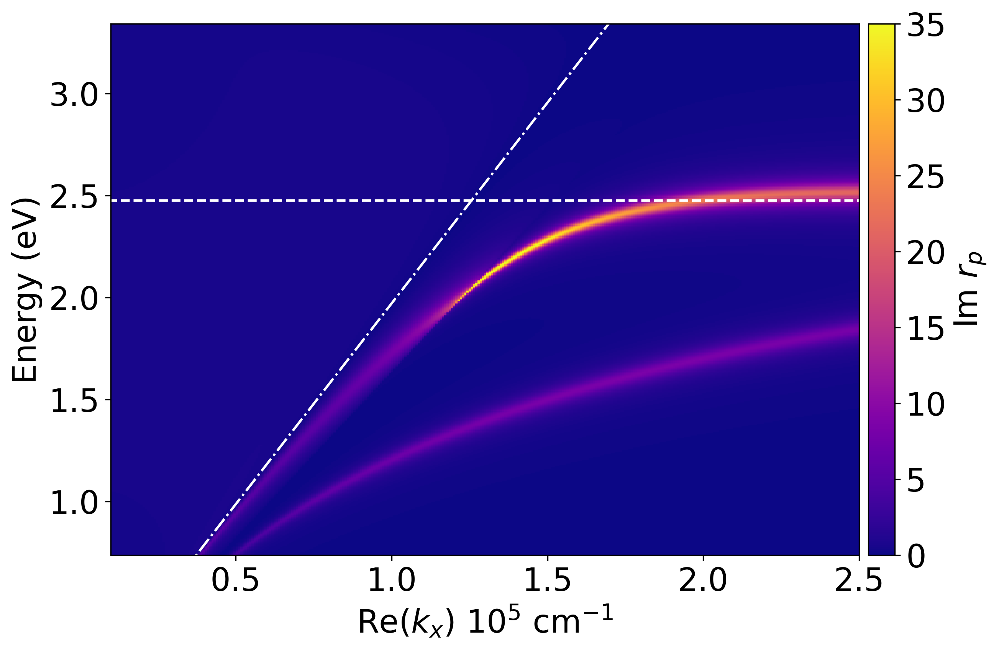

In [17]:
#Ideal Metal on Silicon Dioxide
plt.rcParams.update({'font.size':20})
ideal = drude(E_sham, 3.5, 0.1, 1)

d1 = np.ones_like(E_sham)
rp = reflection_coefficient(E_sham, k, 0.5, d1, ideal, ideal, diel_sio2)
f, a = plt.subplots(figsize = ((10, 6)), dpi = 300)
plt.title("")
im = a.imshow(rp, cmap = cm.plasma, aspect='auto'
           ,extent=[k[0],k[-1],E_sham[0],E_sham[-1]],vmin=0,vmax= 35, origin = 'lower')
cbar = plt.colorbar(im, pad = 0.01)
cbar.set_label('Im $r_p$' )
a.set_ylim(E_sham[0],E_sham[-1])
a.set_xlim(0.1, k[-1])
a.set_ylabel('Energy (eV)')
a.set_xlabel('Re($k_x$) 10$^5$ cm$^{-1}$')
plt.plot(E/1.97, E, color = 'white', linestyle = 'dashdot')
plt.plot(k, 3.5* np.ones_like(k), color = 'white', linestyle = 'dashed')
plt.plot(k, 3.5/np.sqrt(2)* np.ones_like(k), color = 'white', linestyle = 'dashed')


fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\thin_film_ideal_rp.eps'
plt.savefig(fname1, bbox_inches = 'tight', dpi = 'figure', format = 'eps')

used fsolve
k_x (1.236227032910157+0.062037289145154564j)
k_1z (-0.07866389496690201+0.9749348658869779j)
k_2z (0.01386414967968397+2.021639887460174j)
k_3z (-0.07866389496690201+0.9749348658869779j)
Skin Depth Medium 1: 1.0257095473657292
Skin Depth Medium 3: 1.0257095473657292
Propagation Length 16.119337478789646
Dispersion quality (1.1102230246251565e-16-1.5092094240998222e-16j)
Check magnetic boundary condition at z = 0
(0.123373869794529+1.5290558299038604j)
(0.12337386979452912+1.5290558299038604j)
Check magnetic boundary condition at z = d
(-0.12337386979452883-1.5290558299038597j)
(-0.12337386979452881-1.52905582990386j)
k1z sign flip
k3z sign flip


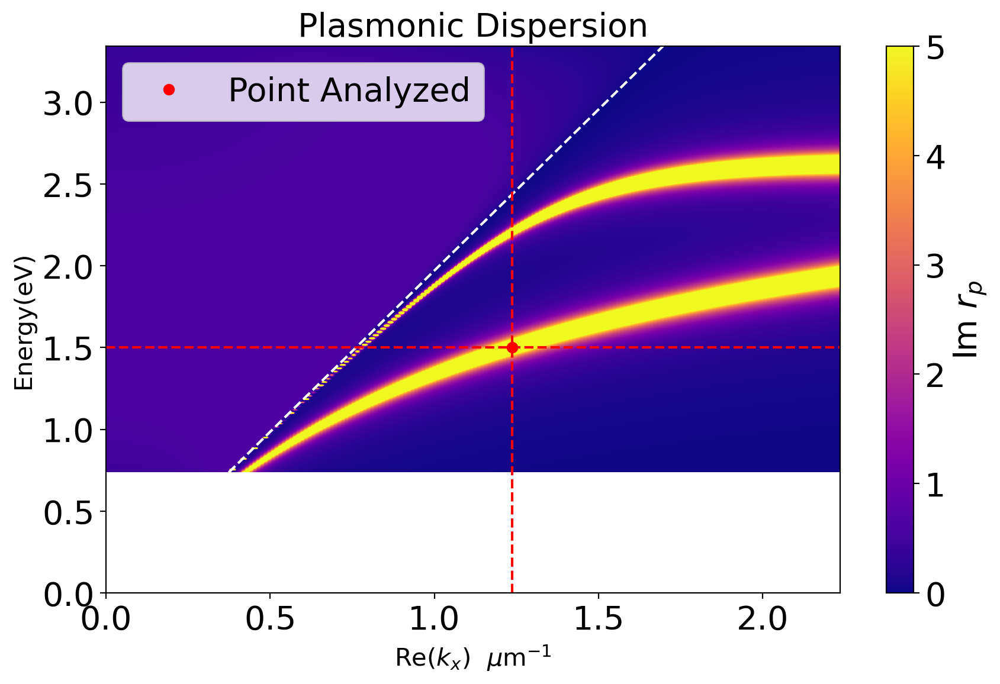

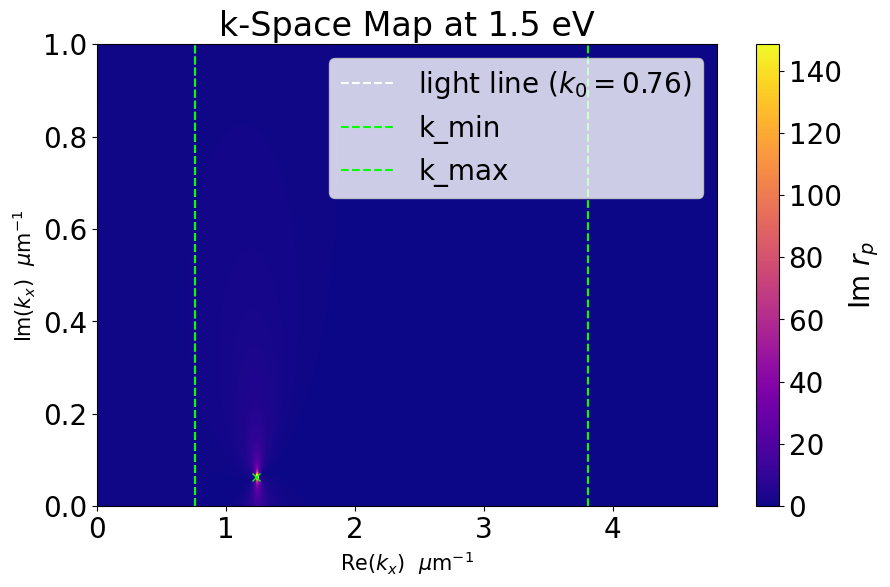

k1z sign flip
k3z sign flip


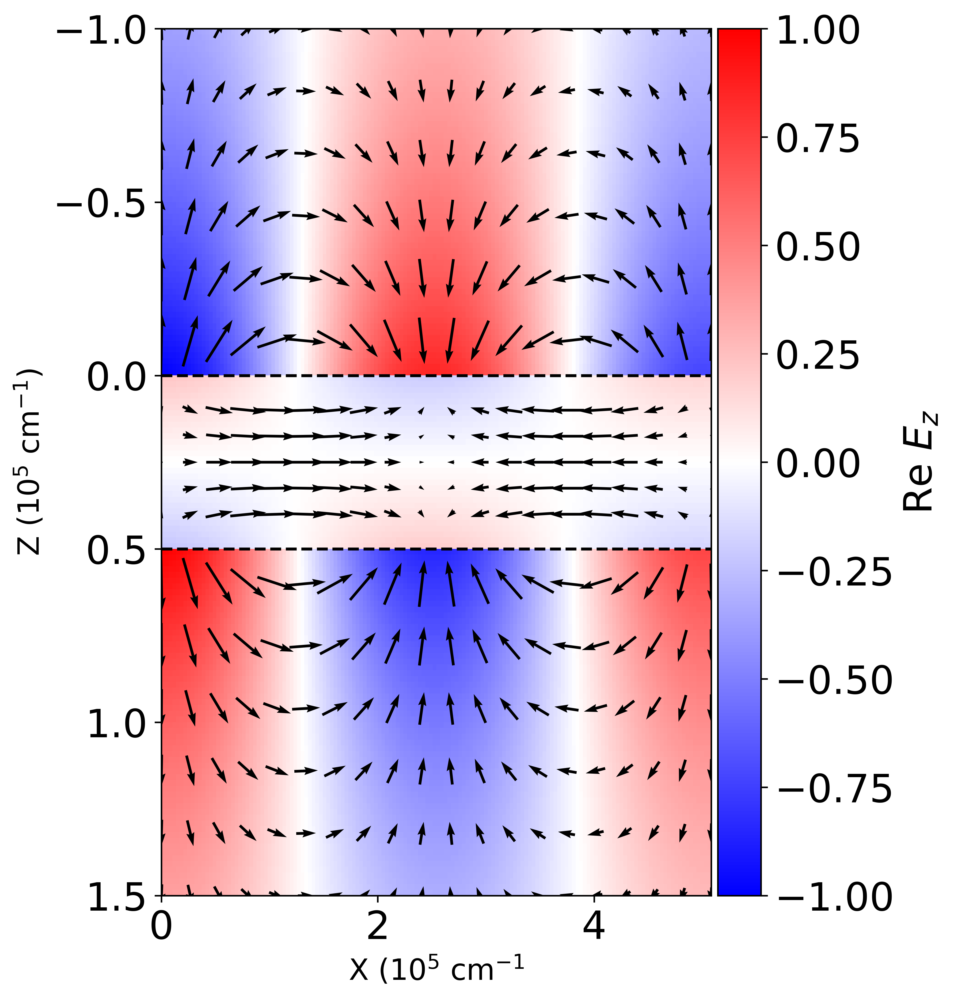

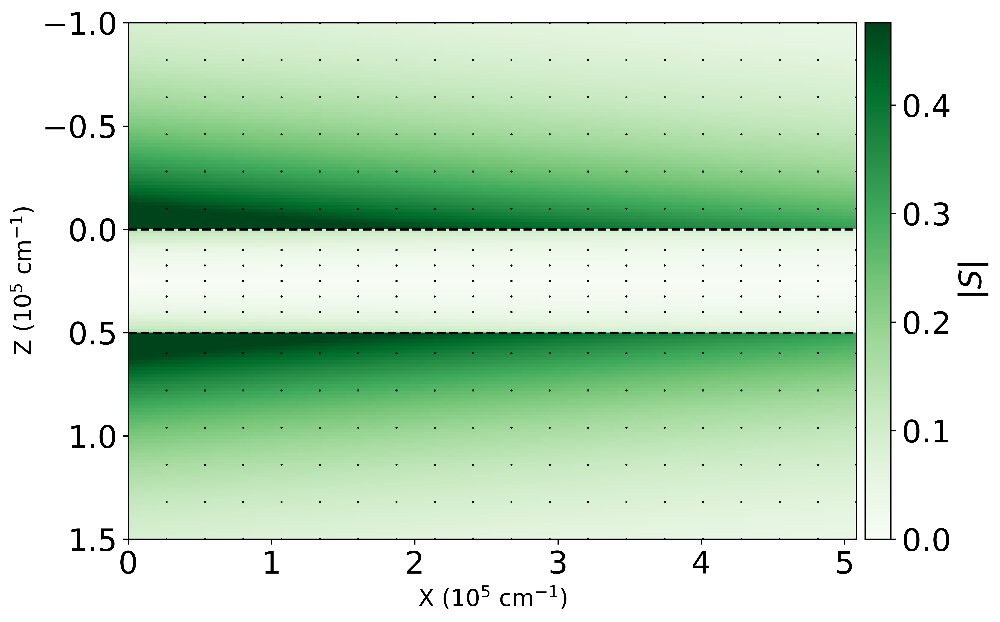

In [18]:
#Metal-vacuum-metal
d1 = np.ones_like(E_sham)
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\vac_metal_vac_lower.eps'
plot_fields(1.5, 0.5, E_sham, d1, ideal, 
                      ideal, d1, fnameE = fname1, fnameS= None, k_min = 1, 
                k_max = 5, k_im_min = 0, k_im_max = 1, vmin0 = 0, vmax0 = 5, spacing = 0.1, 
                z_pixels = 150, x_pixels = 150, 
                z_lower = 1.5, z_upper = -1, arrow_width = 0.015, arrow_scaleE = 3, arrow_scaleS = 50, complex_k = True)

used fsolve
k_x (1.2375978085845845+0.009613658219030312j)
k_1z (-0.022549946762041032+0.5276217487298493j)
k_2z (0.03213535860614496+1.8517340280217018j)
k_3z (-0.022549946762041032+0.5276217487298493j)
Skin Depth Medium 1: 1.895297156357396
Skin Depth Medium 3: 1.895297156357396
Propagation Length 104.01867605616478
Dispersion quality (-1.1102230246251565e-15-1.3877787807814457e-17j)
Check magnetic boundary condition at z = 0
(-0.17834753198555325-4.172960481940985j)
(-0.17834753198555325-4.1729604819409865j)
Check magnetic boundary condition at z = d
(-0.1783475319855533-4.172960481940988j)
(-0.17834753198555334-4.172960481940989j)
k1z sign flip
k3z sign flip


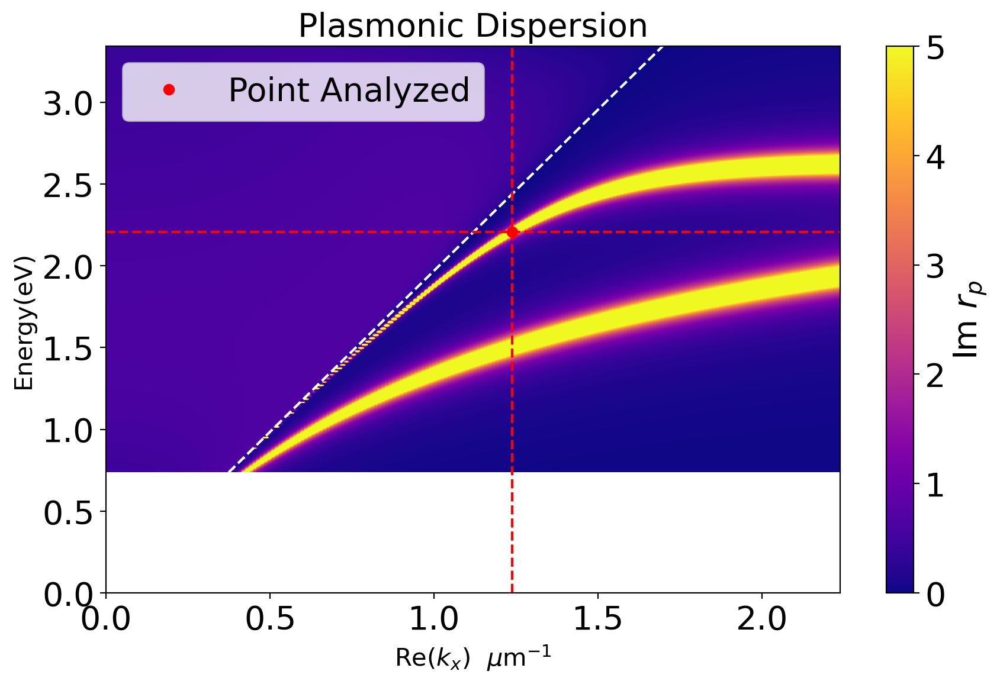

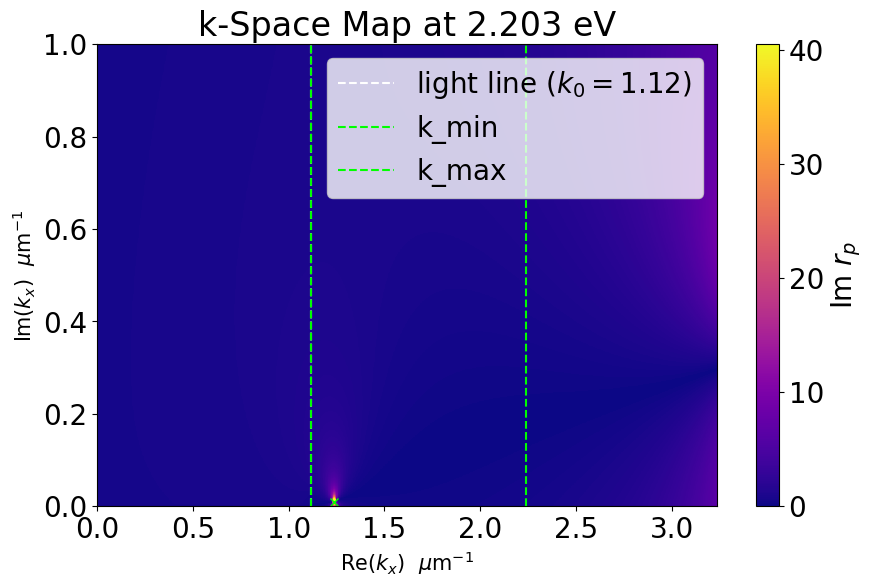

k1z sign flip
k3z sign flip


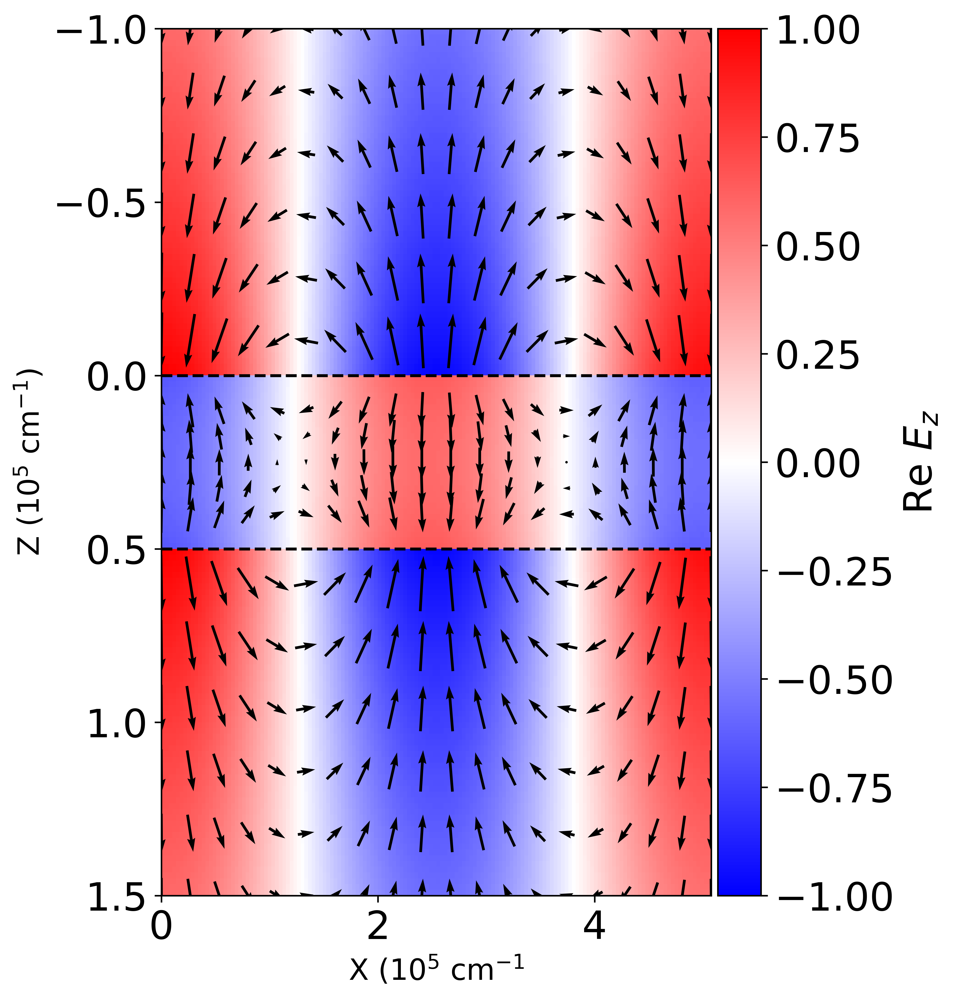

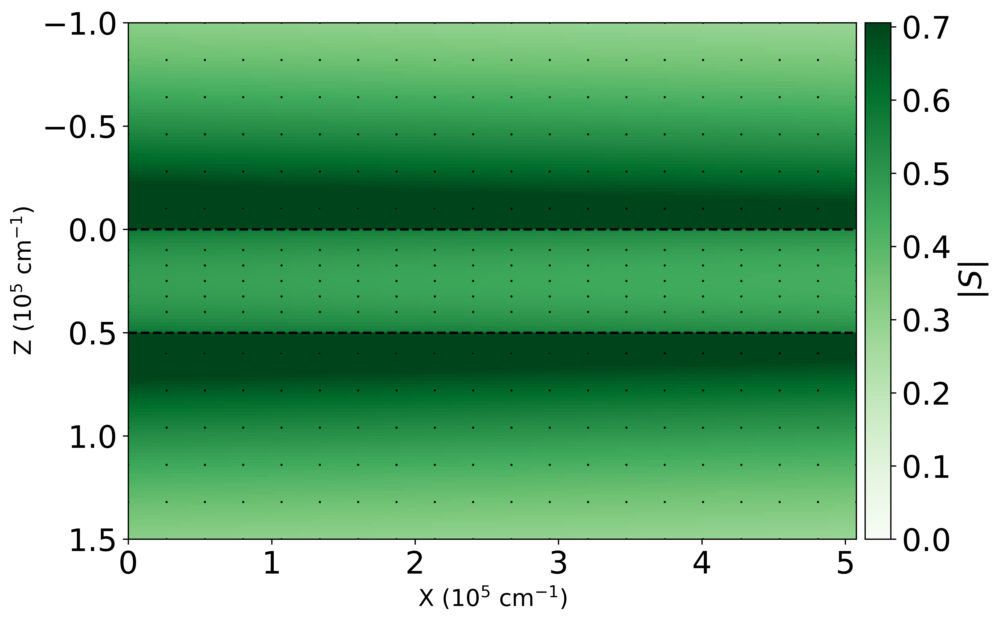

In [19]:
#Metal-vacuum-metal
d1 = np.ones_like(E_sham)
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\vac_metal_vac_upper.eps'
plot_fields(2.203, 0.5, E_sham, d1, ideal, 
                      ideal, d1, fnameE = fname1, fnameS= None, k_min = 1, 
                k_max = 2, k_im_min = 0, k_im_max = 1, vmin0 = 0, vmax0 = 5, spacing = 0.1, 
                z_pixels = 150, x_pixels = 150, 
                z_lower = 1.5, z_upper = -1, arrow_width = 0.015, arrow_scaleE = 3, arrow_scaleS = 50, complex_k = True)

used fsolve
k_x (0.5465441280137846+0.007954979944750919j)
k_1z (-0.021046620018254757+0.2065769978029737j)
k_2z (0.646174502806403+1.8483983177749432j)
k_3z (-0.2697977882509031+0.0161148377288689j)
Skin Depth Medium 1: 4.840810015807118
Skin Depth Medium 3: 62.05461183196103
Propagation Length 125.70741937066082
Dispersion quality (4.6342929493903284e-12-2.510658347887329e-12j)
Check magnetic boundary condition at z = 0
(-1.6658766806926495+6.774939976920288j)
(-1.6658766806853476+6.774939976925889j)
Check magnetic boundary condition at z = d
(-5.333241033316913-0.3185508464618023j)
(-5.333241033316914-0.31855084646180176j)
k1z sign flip
k3z sign flip


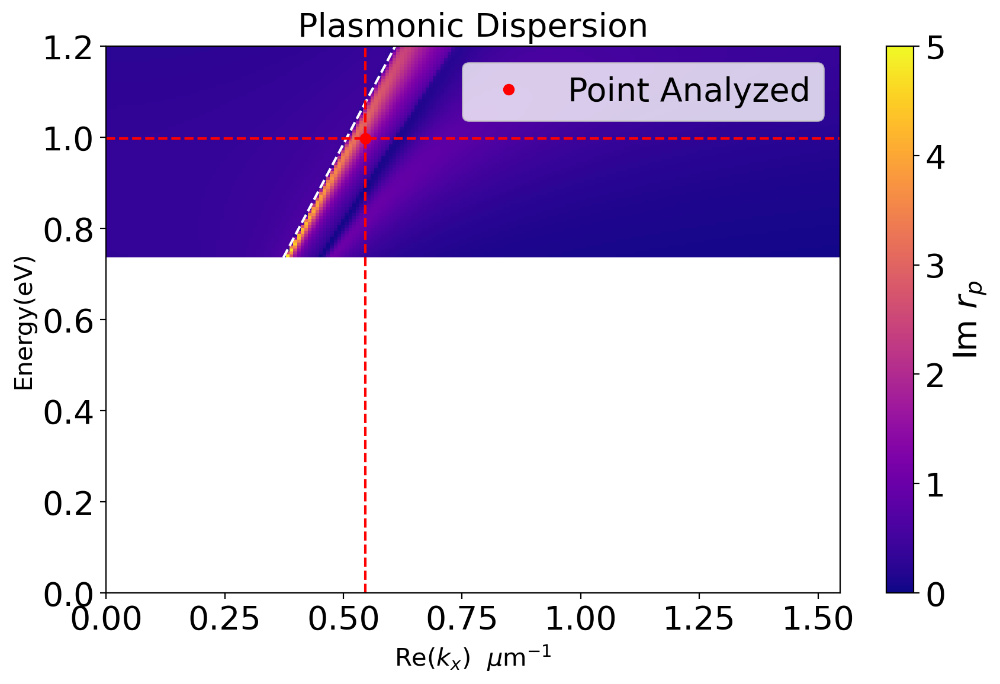

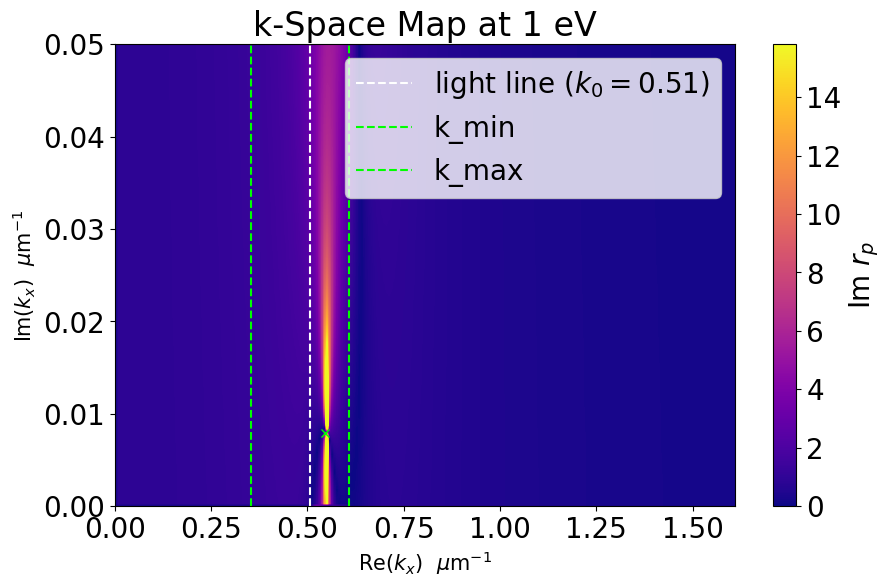

k1z sign flip
k3z sign flip


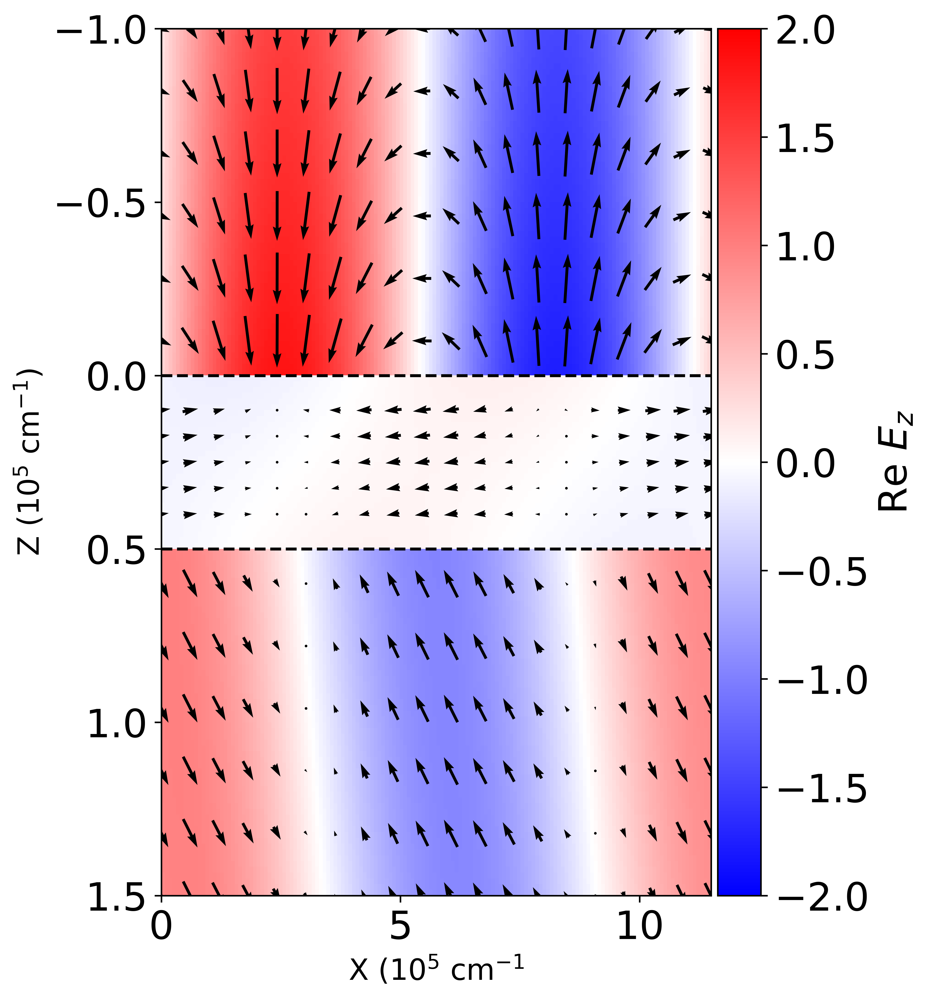

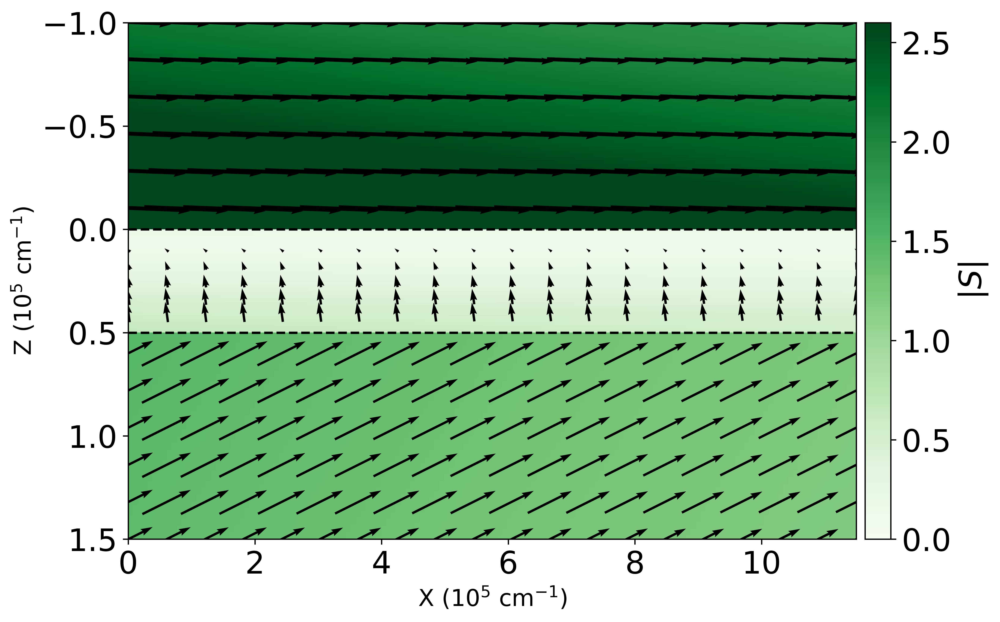

In [20]:
#MXene on Silicon Dioxide
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\upper_MXene_field.eps'

plot_fields(1, 0.5, E_sham, d1, sham_s2, 
                sham_s2, diel_sio2, fnameE = fname1, k_min = 0.7, 
                k_max = 1.2, k_im_min = 0, k_im_max = 0.05, vmin0 = 0, vmax0 = 5,
                z_pixels = 150, x_pixels = 150, spacing = 0.1, 
                z_lower = 1.5, z_upper = -1, arrow_width = 0.033, arrow_scaleE = 3, E_max = 2, complex_k = True)

used fsolve
k_x (0.5465486299573821+0.03999367601872081j)
k_1z (-0.06570423343661247+0.3326800678084013j)
k_2z (0.48611333127337086+1.9791095323499446j)
k_3z (-0.116746559108828+0.1872302618753446j)
Skin Depth Medium 1: 3.0058909347581495
Skin Depth Medium 3: 5.341016938094048
Propagation Length 25.003953113284854
Dispersion quality (5.551115123125783e-16+1.887379141862766e-15j)
Check magnetic boundary condition at z = 0
(0.04633117283090393+2.176561383530537j)
(0.046331172830901046+2.176561383530539j)
Check magnetic boundary condition at z = d
(-2.9819297166043484-4.782217874303817j)
(-2.981929716604349-4.782217874303816j)
k1z sign flip
k3z sign flip


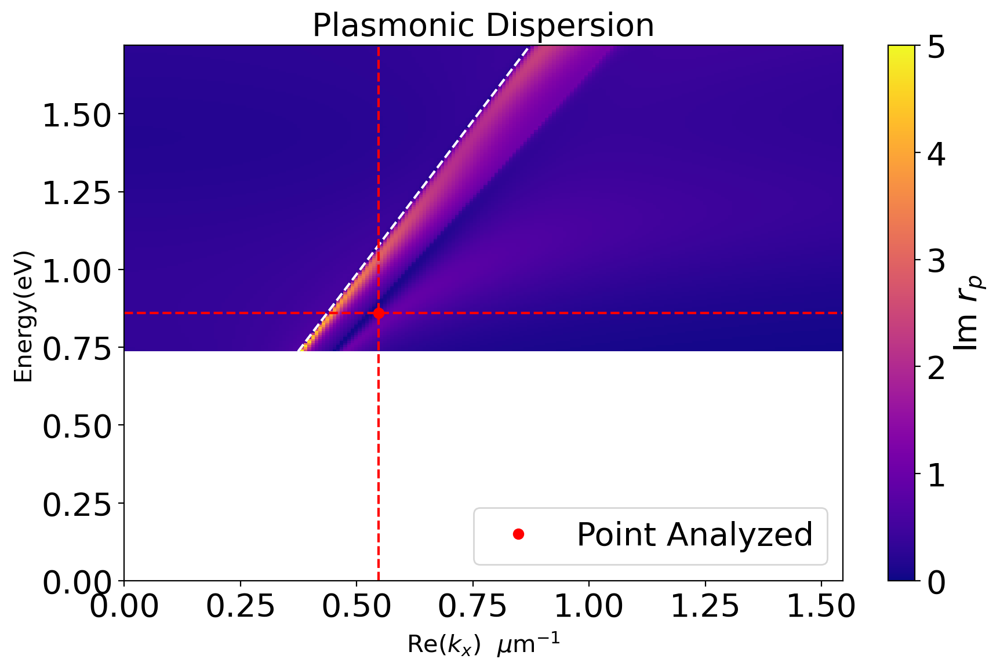

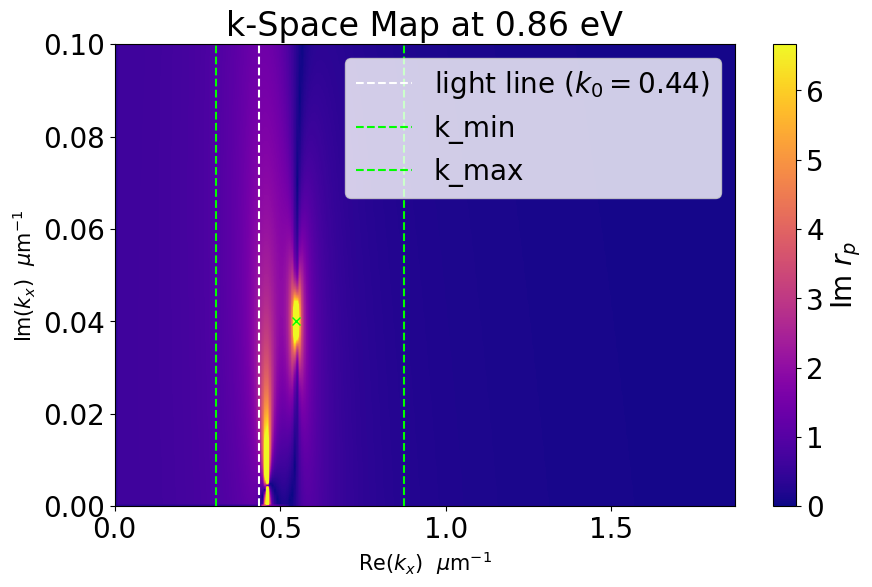

k1z sign flip
k3z sign flip


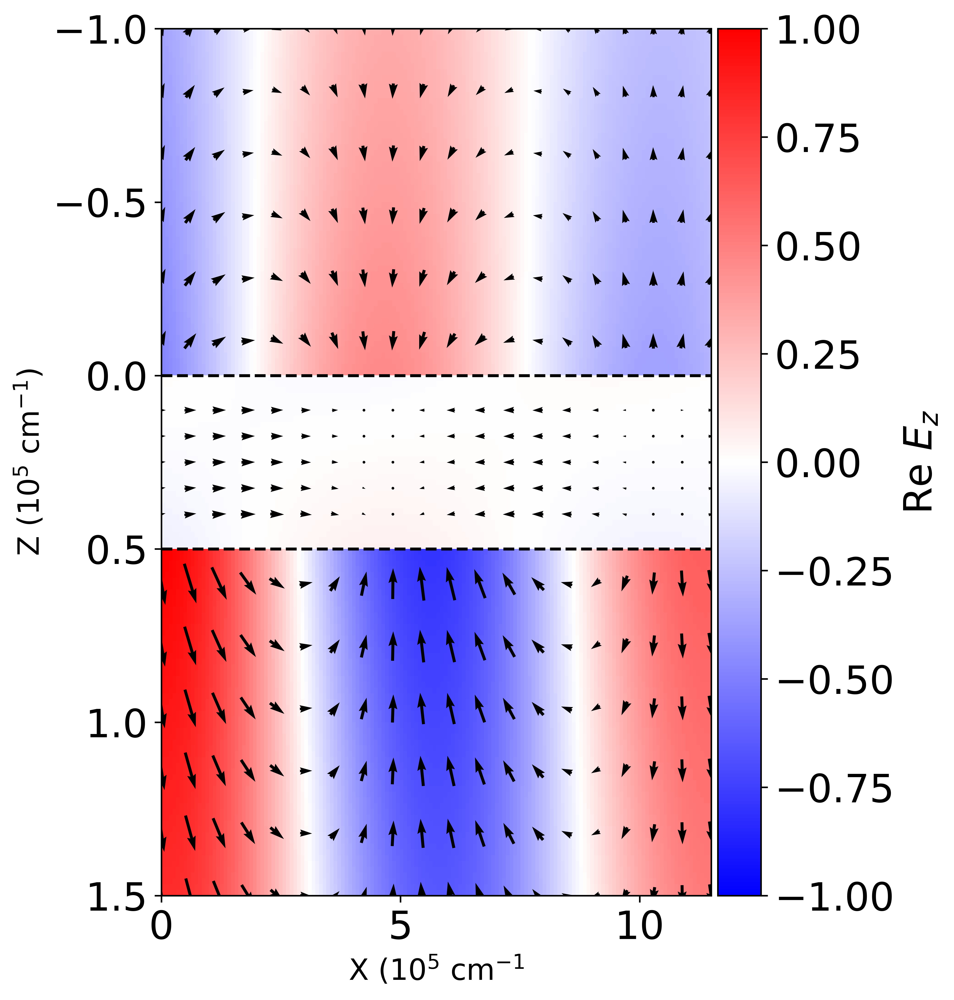

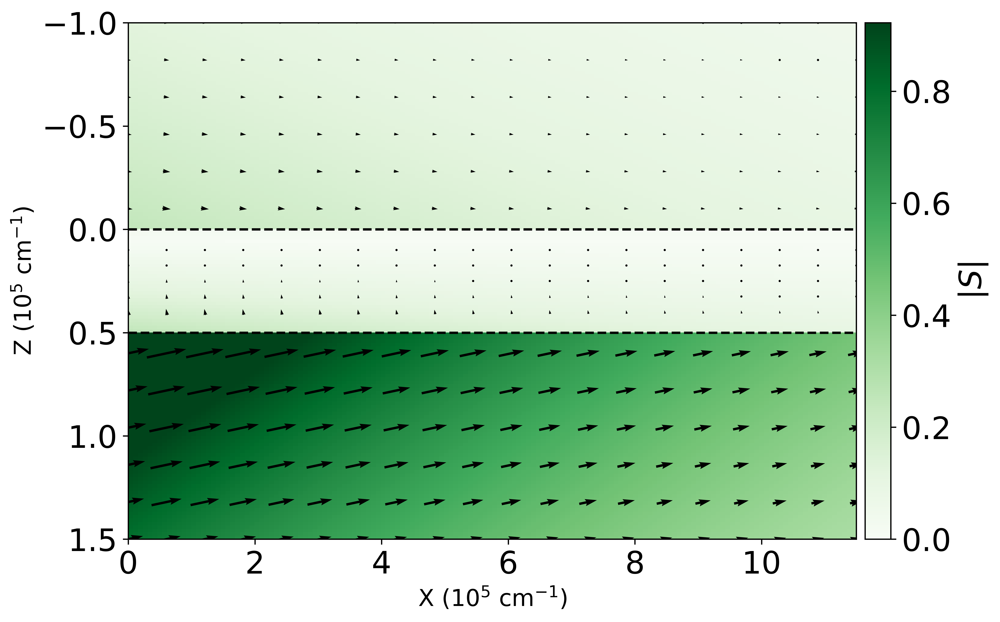

In [21]:
#MXene on Silicon Dioxide
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\lower_MXene_field.eps'
plot_fields(0.86, 0.5, E_sham, d1, sham_s2, 
                sham_s2, diel_sio2, fnameE = fname1, fnameS = None, k_min = 0.7, 
                k_max = 2, k_im_min = 0.02, k_im_max = 0.1, vmin0 = 0, vmax0 = 5, spacing = 0.1,
                z_pixels = 150, x_pixels = 150,
                z_lower = 1.5, z_upper = -1, arrow_width = 0.034, arrow_scaleE = 2, E_max = 1, complex_k = True)

used fsolve
k_x (0.487455573942752+0.02118435771835869j)
k_1z (-0.03520583442692354+0.2933159636265857j)
k_2z (0.41604531159263825+2.041842939231624j)
k_3z (-0.06946943535737886+0.148647145281774j)
Skin Depth Medium 1: 3.4092927900544776
Skin Depth Medium 3: 6.727340764630295
Propagation Length 47.20464095701068
Dispersion quality (-3.008704396734174e-13+2.644551244657123e-13j)
Check magnetic boundary condition at z = 0
(-0.08908811885315698+2.1044981125659463j)
(-0.0890881188537021+2.1044981125654196j)
k1z sign flip
k3z sign flip


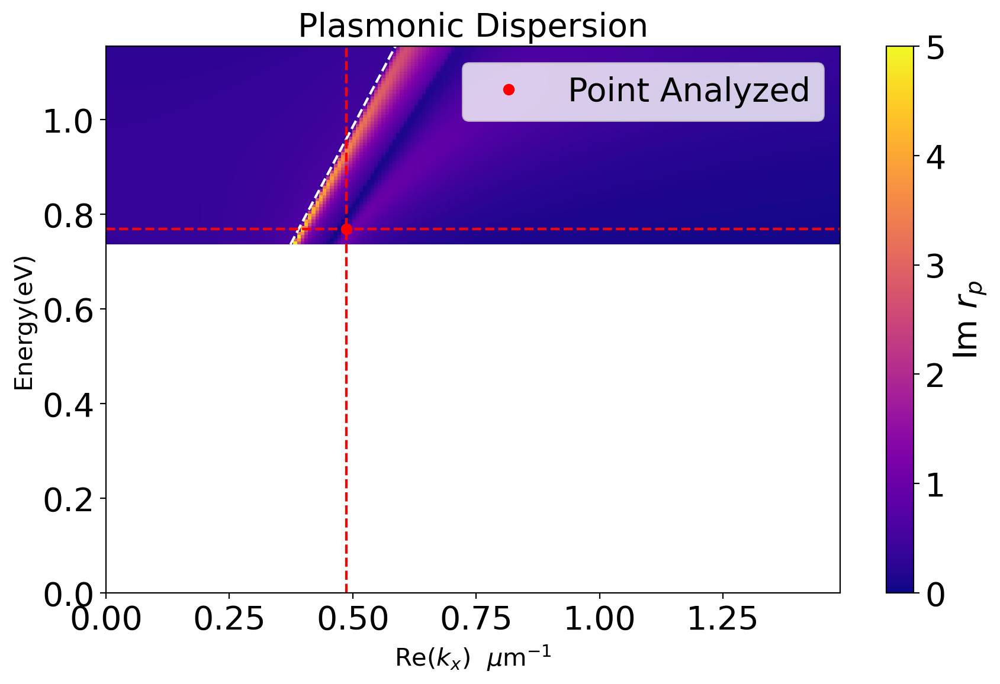

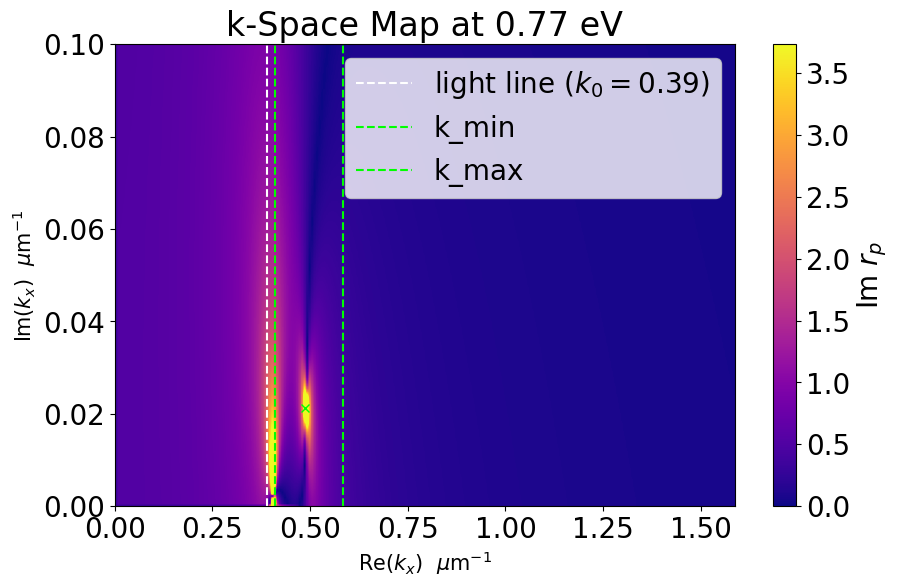

k1z sign flip
k3z sign flip


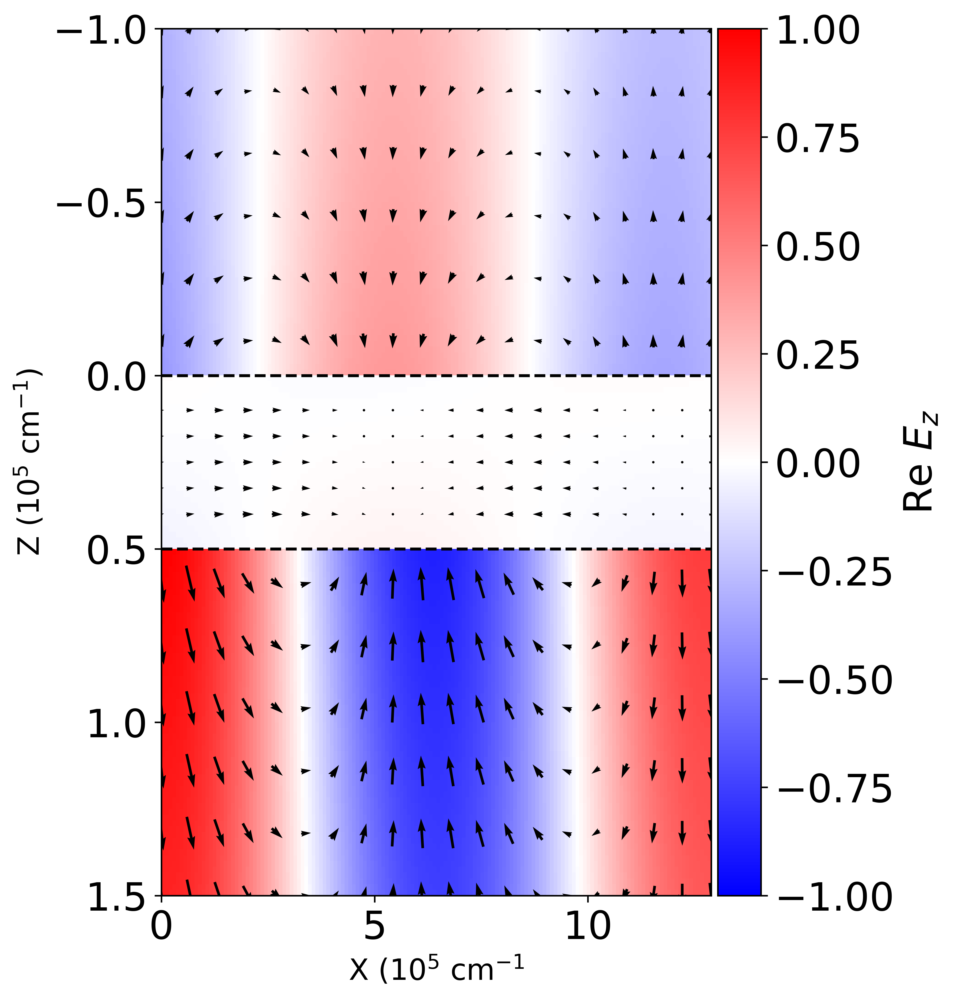

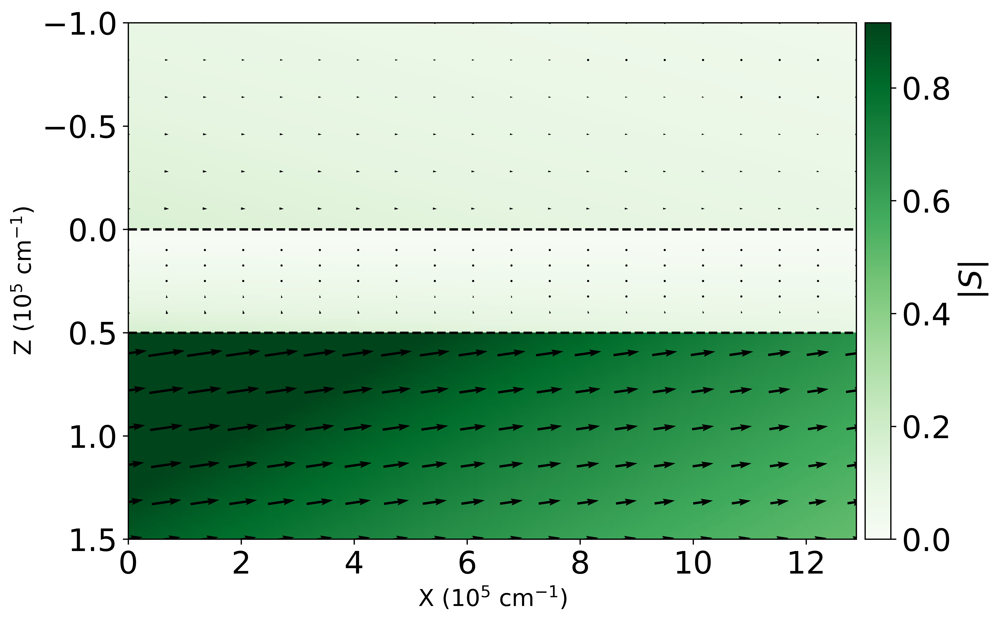

In [38]:
#MXene on Silicon Dioxide
fname1 = r'Y:\Papers\MXene Plasmonics Perspectives\Python Figures\lower_MXene_field.eps'
plot_fields(0.77, 0.5, E_sham, d1, sham_s2, 
                    sham_s2, diel_sio2, fnameE = fname1, fnameS = None, k_min = 1.05, 
                k_max = 1.5, k_im_min = 0.02, k_im_max = 0.1, vmin0 = 0, vmax0 = 5, spacing = 0.1,
                z_pixels = 150, x_pixels = 150,
                z_lower = 1.5, z_upper = -1, arrow_width = 0.034, arrow_scaleE = 2, E_max = 1, complex_k = True)